In [734]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
import datetime as dt

# import dataset 1

In [735]:
data1 = pd.read_csv('../1_owid/owid-covid-data.csv')

In [736]:
data1 = data1[data1.continent == 'Europe']

In [737]:
data1.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,total_vaccinations_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
316,ALB,Europe,Albania,2020-03-09,2.0,2.0,NaN,NaN,NaN,NaN,0.695,0.695,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.11,2877800.0,104.871,38.0,13.188,8.643,11803.431,1.1,304.195,10.08,7.1,51.2,NaN,2.89,78.57,0.785
317,ALB,Europe,Albania,2020-03-10,10.0,8.0,NaN,NaN,NaN,NaN,3.475,2.780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.67,2877800.0,104.871,38.0,13.188,8.643,11803.431,1.1,304.195,10.08,7.1,51.2,NaN,2.89,78.57,0.785
318,ALB,Europe,Albania,2020-03-11,12.0,2.0,NaN,1.0,1.0,NaN,4.170,0.695,NaN,0.347,0.347,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.85,2877800.0,104.871,38.0,13.188,8.643,11803.431,1.1,304.195,10.08,7.1,51.2,NaN,2.89,78.57,0.785
319,ALB,Europe,Albania,2020-03-12,23.0,11.0,NaN,1.0,0.0,NaN,7.992,3.822,NaN,0.347,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.85,2877800.0,104.871,38.0,13.188,8.643,11803.431,1.1,304.195,10.08,7.1,51.2,NaN,2.89,78.57,0.785
320,ALB,Europe,Albania,2020-03-13,33.0,10.0,NaN,1.0,0.0,NaN,11.467,3.475,NaN,0.347,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78.70,2877800.0,104.871,38.0,13.188,8.643,11803.431,1.1,304.195,10.08,7.1,51.2,NaN,2.89,78.57,0.785


In [738]:
print('Number of European countries in dataset 1:', len(data1.location.unique()))

Number of European countries in dataset 1: 46


In [739]:
data1.location.unique()

array(['Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium',
       'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus',
       'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
       'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo',
       'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta',
       'Moldova', 'Monaco', 'Montenegro', 'Netherlands',
       'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania',
       'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain',
       'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican'],
      dtype=object)

In [740]:
data1.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'total_vaccinations_per_hundred', 'stringency_index', 'population',
       'population_density', 'median_age', 'aged_65_older', 'ag

In [741]:
data1 = data1[['iso_code', 'continent', 'location', 'date', 'total_cases',
       'new_cases_smoothed', 'total_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_smoothed_per_million',
       'total_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate',
       'icu_patients_per_million', 
       'hosp_patients_per_million', 
       'weekly_icu_admissions_per_million', 
       'weekly_hosp_admissions_per_million',
       'total_tests_per_thousand','new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 
       'total_vaccinations_per_hundred', 'stringency_index', 'population',
       'population_density', 'median_age', 'aged_65_older', 'aged_70_older',
       'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate',
       'diabetes_prevalence', 
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index']]

In [742]:
data1.date = pd.to_datetime(data1.date)

In [743]:
data1.set_index('date', inplace=True)

location
Albania                   AxesSubplot(0.125,0.125;0.775x0.755)
Andorra                   AxesSubplot(0.125,0.125;0.775x0.755)
Austria                   AxesSubplot(0.125,0.125;0.775x0.755)
Belarus                   AxesSubplot(0.125,0.125;0.775x0.755)
Belgium                   AxesSubplot(0.125,0.125;0.775x0.755)
Bosnia and Herzegovina    AxesSubplot(0.125,0.125;0.775x0.755)
Bulgaria                  AxesSubplot(0.125,0.125;0.775x0.755)
Croatia                   AxesSubplot(0.125,0.125;0.775x0.755)
Cyprus                    AxesSubplot(0.125,0.125;0.775x0.755)
Czechia                   AxesSubplot(0.125,0.125;0.775x0.755)
Denmark                   AxesSubplot(0.125,0.125;0.775x0.755)
Estonia                   AxesSubplot(0.125,0.125;0.775x0.755)
Finland                   AxesSubplot(0.125,0.125;0.775x0.755)
France                    AxesSubplot(0.125,0.125;0.775x0.755)
Germany                   AxesSubplot(0.125,0.125;0.775x0.755)
Greece                    AxesSubplot(0.125,0.

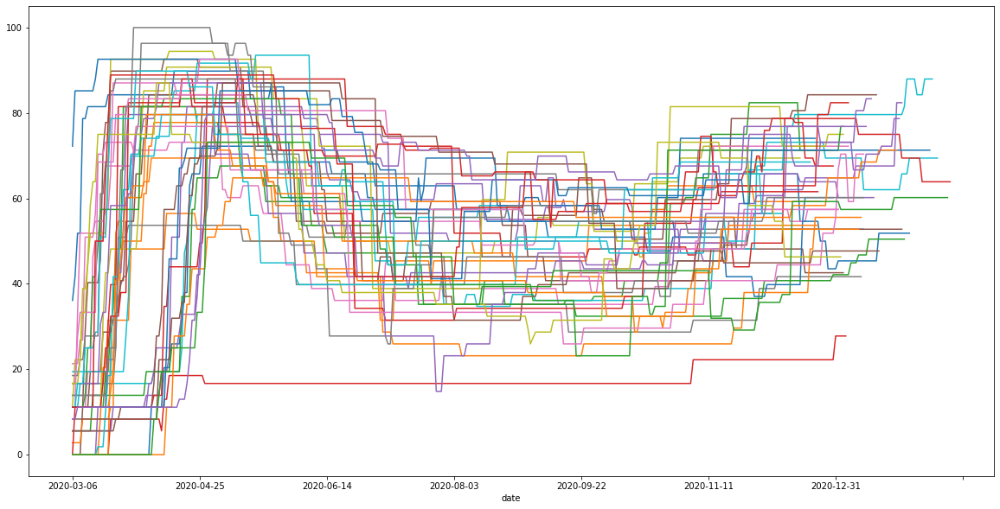

In [744]:
plt.figure(figsize=(20,10))
location_group['stringency_index'].plot()

# import policy dates from dataset 2

In [745]:
data2_policy = pd.read_csv("../2_ecdc/country_response_measures.csv")
data2_policy['date_start'] = pd.to_datetime(data2_policy['date_start'])
data2_policy['date_end'] = pd.to_datetime(data2_policy['date_end'])

In [746]:
data2_policy[data2_policy.Country=='France'].sort_values('date_start')

,Country,Response_measure,date_start,date_end
403,France,MassGatherAll,2020-02-29,2020-09-17
396,France,IndoorOver1000,2020-02-29,2020-10-18
410,France,OutdoorOver1000,2020-03-13,2020-07-11
381,France,ClosDaycare,2020-03-16,2020-06-01
384,France,ClosHighPartial,2020-03-16,2020-06-22
385,France,ClosPrimPartial,2020-03-16,2020-06-22
386,France,ClosPubAny,2020-03-16,2020-05-10
416,France,RestaurantsCafes,2020-03-16,2020-06-01
389,France,ClosSec,2020-03-16,2020-05-10
391,France,EntertainmentVenues,2020-03-16,2020-06-01


In [747]:
data2_policy[data2_policy.Country=='Germany'].sort_values('date_start')

,Country,Response_measure,date_start,date_end
448,Germany,IndoorOver1000,2020-03-08,2020-03-22
457,Germany,MassGatherAll,2020-03-08,2020-05-10
431,Germany,ClosDaycare,2020-03-13,2020-05-14
434,Germany,ClosPrim,2020-03-13,2020-05-03
439,Germany,ClosSec,2020-03-13,2020-05-03
460,Germany,NonEssentialShops,2020-03-16,2020-04-20
442,Germany,EntertainmentVenues,2020-03-16,2020-05-04
437,Germany,ClosPubAny,2020-03-16,2020-05-04
470,Germany,StayHomeGen,2020-03-17,2020-05-05
428,Germany,BanOnAllEvents,2020-03-23,2020-05-10


In [748]:
data2_policy[data2_policy.Country=='Switzerland'].sort_values('date_start')

,Country,Response_measure,date_start,date_end
1277,Switzerland,MassGatherAll,2020-02-28,2020-10-01
1282,Switzerland,OutdoorOver1000,2020-02-28,2020-03-12
1270,Switzerland,IndoorOver1000,2020-03-02,2020-03-12
1280,Switzerland,OutdoorOver100,2020-03-13,2020-03-19
1268,Switzerland,IndoorOver100,2020-03-13,2020-03-19
1266,Switzerland,GymsSportsCentres,2020-03-16,2020-05-10
1274,Switzerland,MasksVoluntaryClosedSpaces,2020-03-16,2020-07-05
1290,Switzerland,Teleworking,2020-03-16,NaT
1261,Switzerland,ClosPubAny,2020-03-16,2020-05-10
1260,Switzerland,ClosPrim,2020-03-16,2020-05-11


# outer merge of policy dates

In [749]:
pd.set_option('display.max_rows', 200)
merge = pd.merge(data2_policy[data2_policy.Country=='Germany'], 
                 data2_policy[data2_policy.Country=='France'].sort_values('date_start'), 
                 how ='outer',
                 on=['date_start', 'Response_measure']).sort_values('date_start')
merge = pd.merge(merge, 
                 data2_policy[data2_policy.Country=='Switzerland'].sort_values('date_start'), 
                 how ='outer',
                 on=['date_start', 'Response_measure']).sort_values('date_start')
merge.head(200)

,Country_x,Response_measure,date_start,date_end_x,Country_y,date_end_y,Country,date_end
90,NaN,MassGatherAll,2020-02-28,NaT,NaN,NaT,Switzerland,2020-10-01
91,NaN,OutdoorOver1000,2020-02-28,NaT,NaN,NaT,Switzerland,2020-03-12
0,NaN,IndoorOver1000,2020-02-29,NaT,France,2020-10-18,NaN,NaT
1,NaN,MassGatherAll,2020-02-29,NaT,France,2020-09-17,NaN,NaT
92,NaN,IndoorOver1000,2020-03-02,NaT,NaN,NaT,Switzerland,2020-03-12
3,Germany,IndoorOver1000,2020-03-08,2020-03-22,NaN,NaT,NaN,NaT
2,Germany,MassGatherAll,2020-03-08,2020-05-10,NaN,NaT,NaN,NaT
4,Germany,ClosSec,2020-03-13,2020-05-03,NaN,NaT,NaN,NaT
5,NaN,OutdoorOver1000,2020-03-13,NaT,France,2020-07-11,NaN,NaT
6,Germany,ClosDaycare,2020-03-13,2020-05-14,NaN,NaT,NaN,NaT


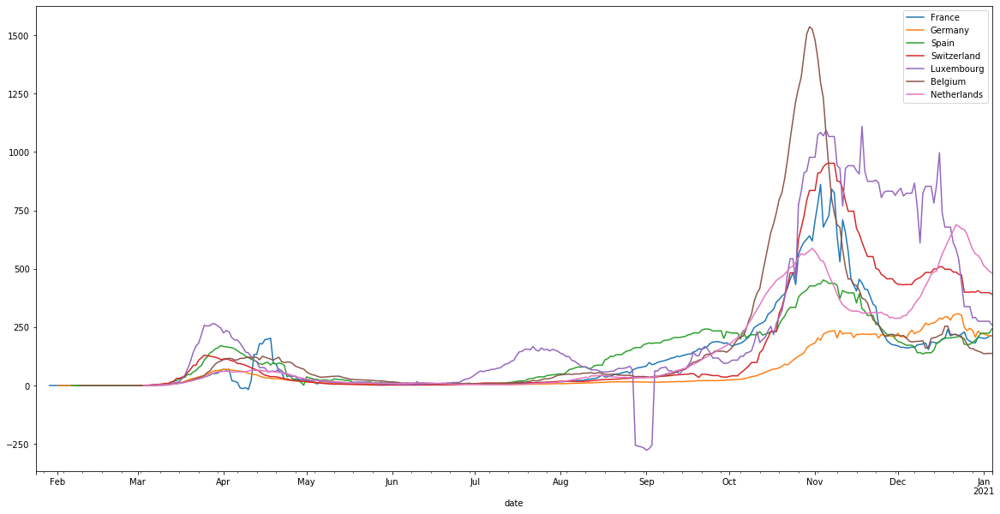

In [750]:
plt.figure(figsize=(20,10))
countries = ['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'].plot()

plt.legend(['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands'])

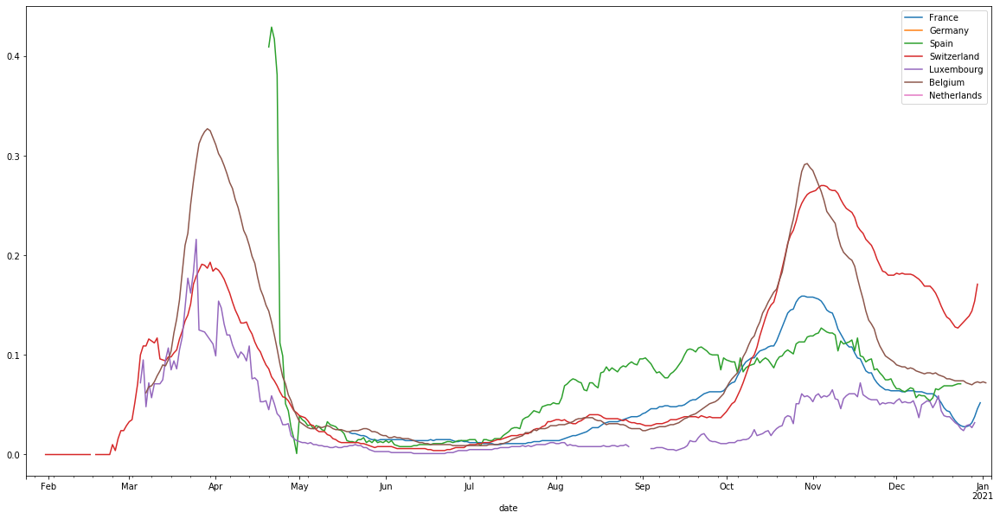

In [751]:
plt.figure(figsize=(20,10))
for c in countries:
    data1[data1.location == c]['positive_rate'].plot()

plt.legend(['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands'])

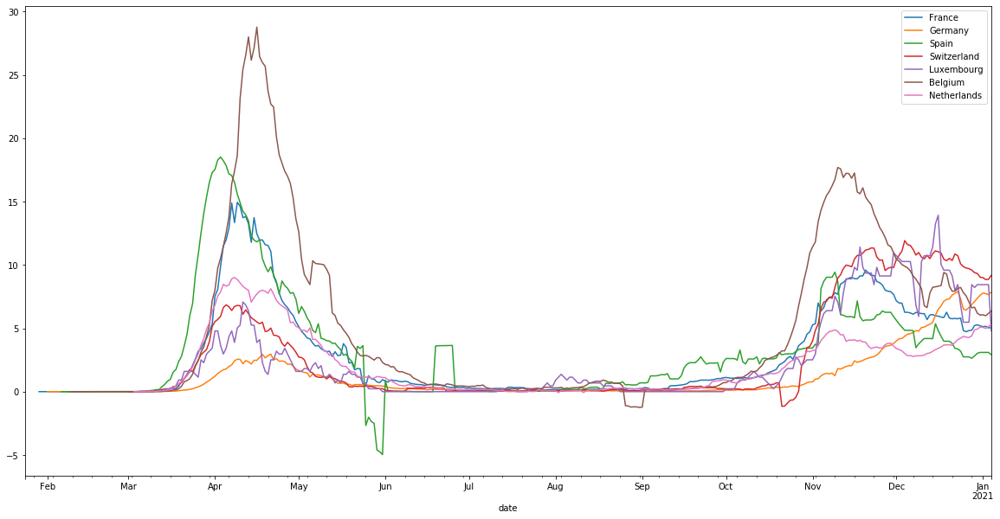

In [752]:
plt.figure(figsize=(20,10))
for c in countries:
    data1[data1.location == c]['new_deaths_smoothed_per_million'].plot()

plt.legend(['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands'])

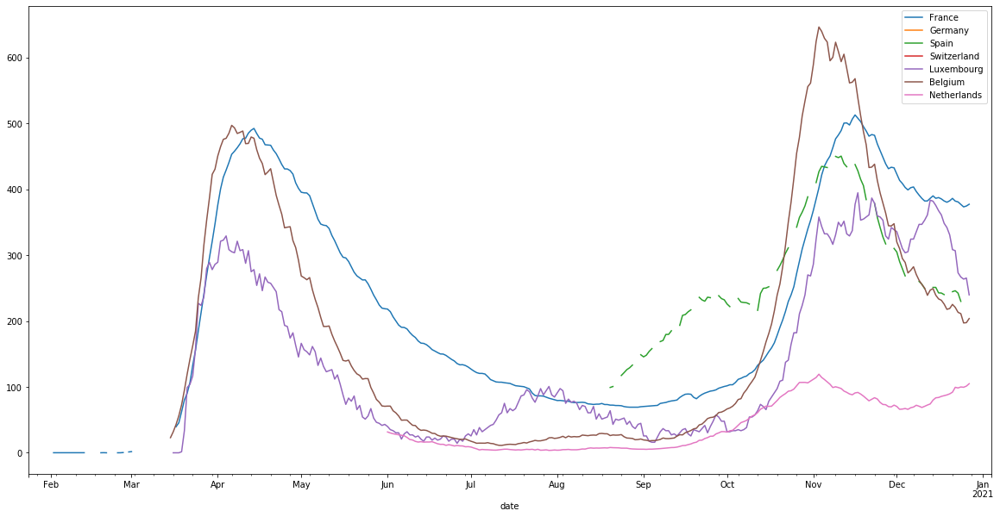

In [753]:
plt.figure(figsize=(20,10))
for c in countries:
    data1[data1.location == c]['hosp_patients_per_million'].plot()

plt.legend(['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands'])

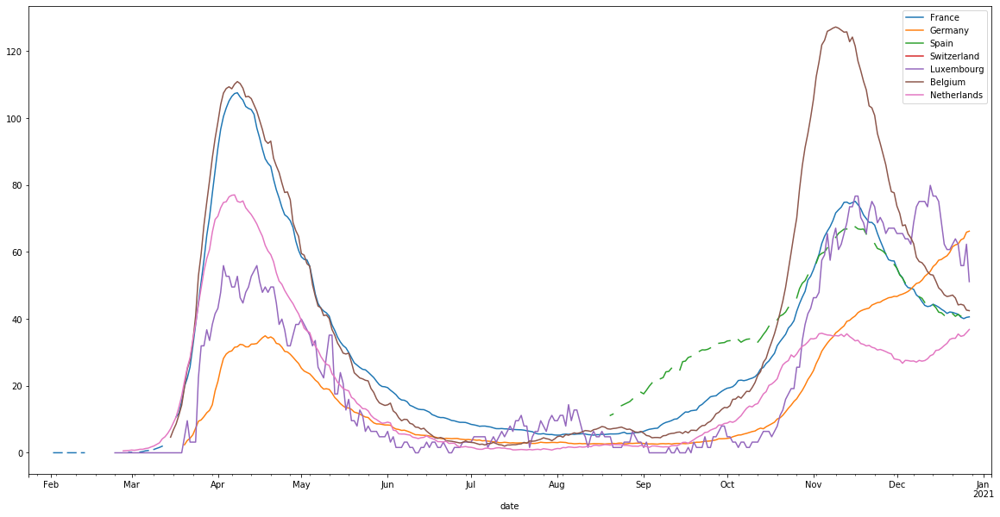

In [754]:
plt.figure(figsize=(20,10))
for c in countries:
    data1[data1.location == c]['icu_patients_per_million'].plot()

plt.legend(['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands'])

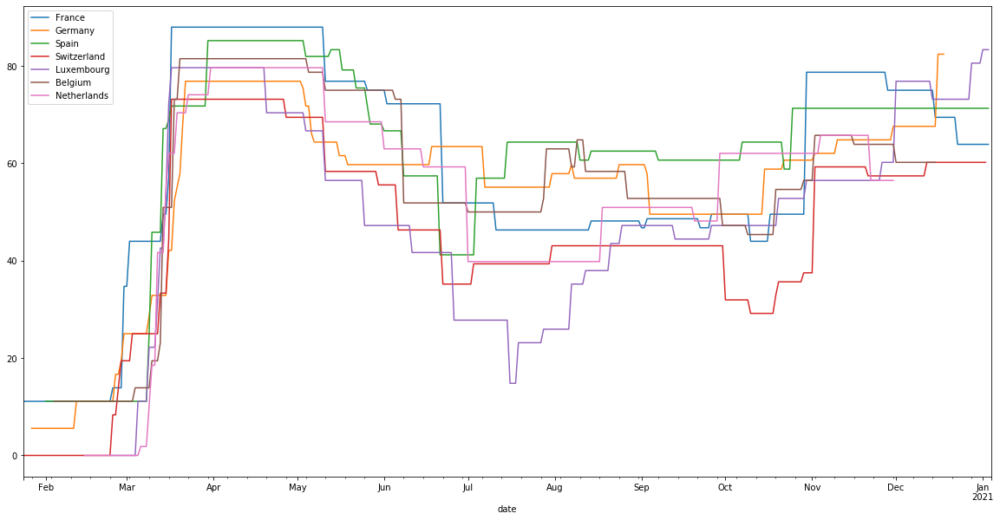

In [755]:
plt.figure(figsize=(20,10))
for c in countries:
    data1[data1.location == c]['stringency_index'].plot()

plt.legend(countries)

# North

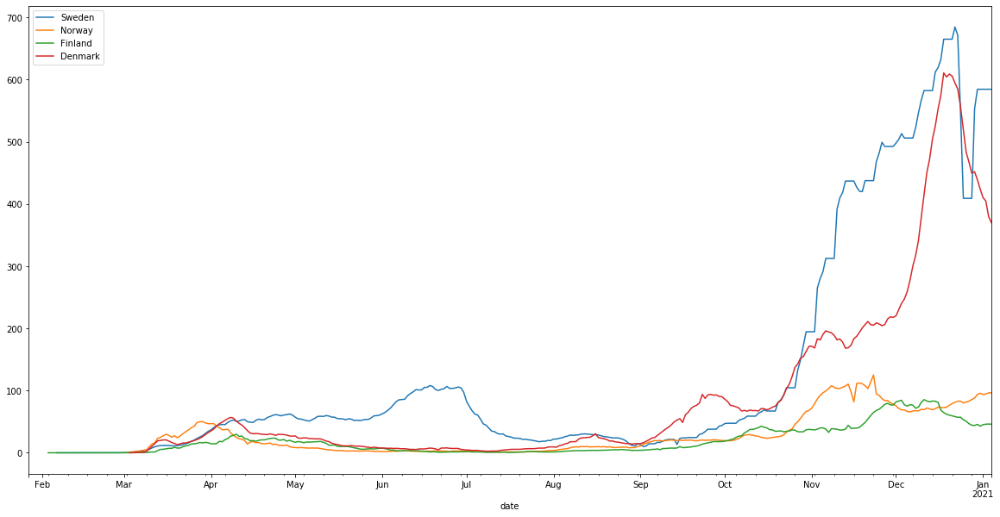

In [756]:
plt.figure(figsize=(20,10))
countries = ['Sweden','Norway','Finland','Denmark']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'].plot()

plt.legend(countries)

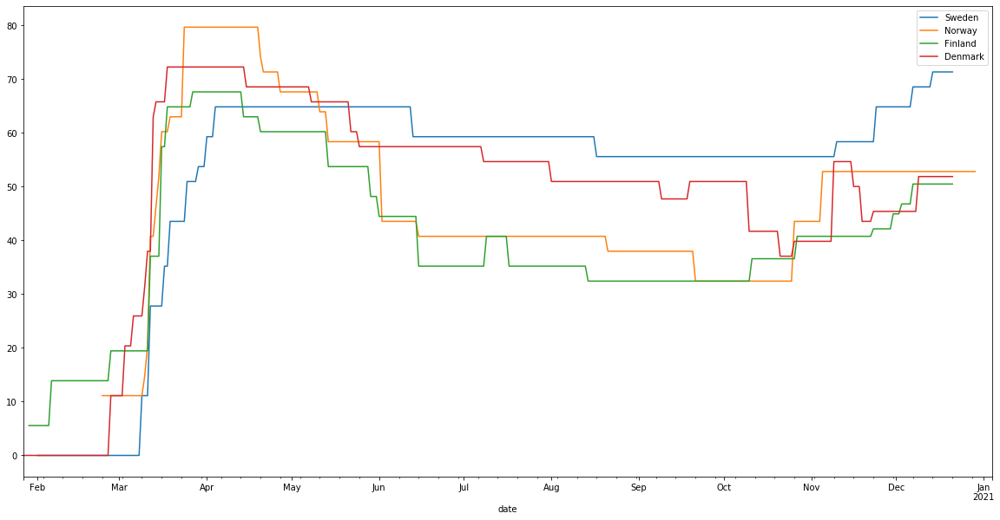

In [757]:
plt.figure(figsize=(20,10))
for c in countries:
    data1[data1.location == c]['stringency_index'].plot()

plt.legend(countries)

In [758]:
data2_policy[data2_policy.Country=='France'].sort_values('date_start')

,Country,Response_measure,date_start,date_end
403,France,MassGatherAll,2020-02-29,2020-09-17
396,France,IndoorOver1000,2020-02-29,2020-10-18
410,France,OutdoorOver1000,2020-03-13,2020-07-11
381,France,ClosDaycare,2020-03-16,2020-06-01
384,France,ClosHighPartial,2020-03-16,2020-06-22
385,France,ClosPrimPartial,2020-03-16,2020-06-22
386,France,ClosPubAny,2020-03-16,2020-05-10
416,France,RestaurantsCafes,2020-03-16,2020-06-01
389,France,ClosSec,2020-03-16,2020-05-10
391,France,EntertainmentVenues,2020-03-16,2020-06-01


# policy dates as vertical bars

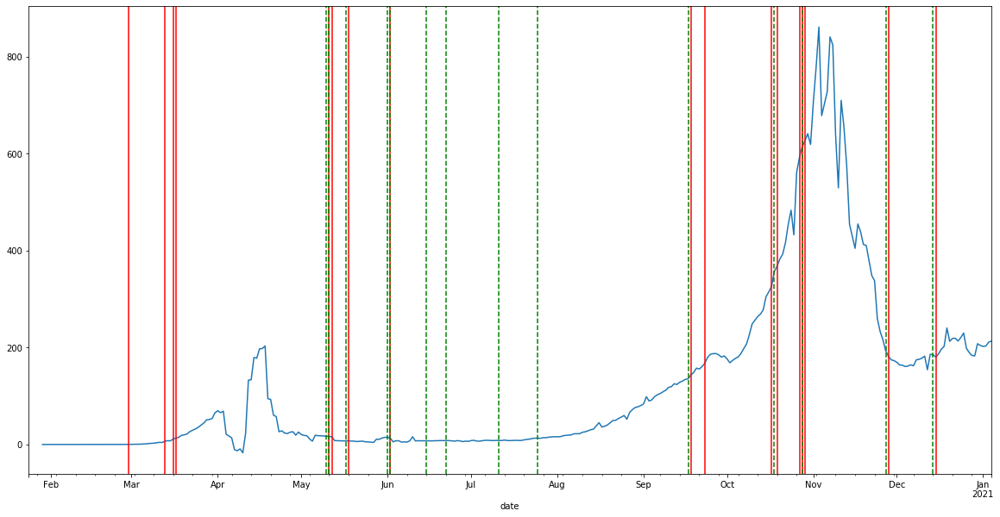

In [759]:
plt.figure(figsize=(20,10))
data1[data1.location == 'France']['new_cases_smoothed_per_million'].plot()
#plt.axvline(pd.to_datetime('2020-06-01'),color='r')

date_start = data2_policy[data2_policy.Country=='France']['date_start'].unique()
date_end = data2_policy[data2_policy.Country=='France']['date_end'].dropna().unique()

for v in date_start:
     plt.axvline(x=v, color='r', linestyle='-')
for v in date_end:
     plt.axvline(x=v, color='g', linestyle='--')

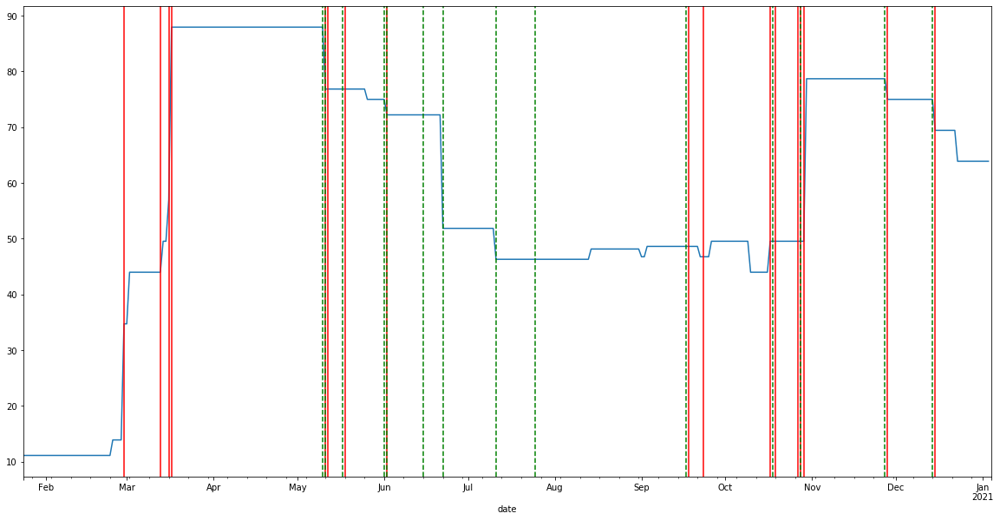

In [760]:
plt.figure(figsize=(20,10))
data1[data1.location == 'France']['stringency_index'].plot()
#plt.axvline(pd.to_datetime('2020-06-01'),color='r')

date_start = data2_policy[data2_policy.Country=='France']['date_start'].unique()
date_end = data2_policy[data2_policy.Country=='France']['date_end'].dropna().unique()

for v in date_start:
     plt.axvline(x=v, color='r', linestyle='-')
for v in date_end:
     plt.axvline(x=v, color='g', linestyle='--')

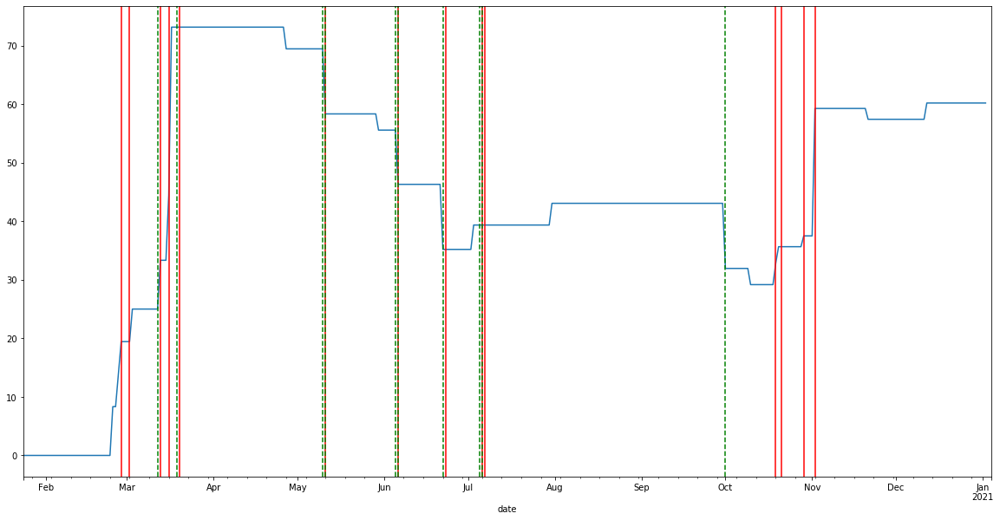

In [761]:
plt.figure(figsize=(20,10))
data1[data1.location == 'Switzerland']['stringency_index'].plot()
#plt.axvline(pd.to_datetime('2020-06-01'),color='r')

date_start = data2_policy[data2_policy.Country=='Switzerland']['date_start'].unique()
date_end = data2_policy[data2_policy.Country=='Switzerland']['date_end'].dropna().unique()

for v in date_start:
     plt.axvline(x=v, color='r', linestyle='-')
for v in date_end:
     plt.axvline(x=v, color='g', linestyle='--')

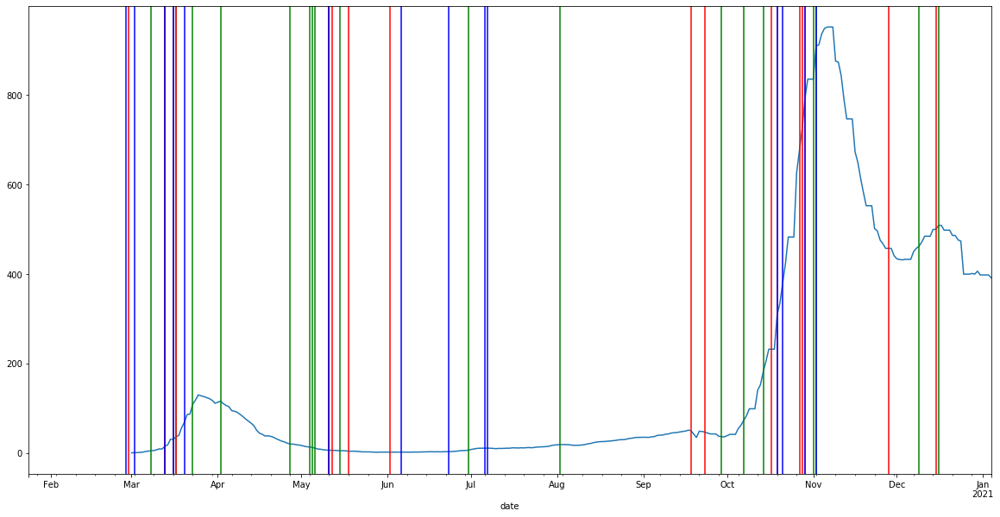

In [762]:
plt.figure(figsize=(20,10))
data1[data1.location == 'Switzerland']['new_cases_smoothed_per_million'].plot()
#plt.axvline(pd.to_datetime('2020-06-01'),color='r')

date_start1 = data2_policy[data2_policy.Country=='Germany']['date_start'].unique()
date_end1 = data2_policy[data2_policy.Country=='Germany']['date_end'].dropna().unique()

date_start2 = data2_policy[data2_policy.Country=='France']['date_start'].unique()
date_end2 = data2_policy[data2_policy.Country=='France']['date_end'].dropna().unique()

date_start3 = data2_policy[data2_policy.Country=='Switzerland']['date_start'].unique()
date_end3 = data2_policy[data2_policy.Country=='Switzerland']['date_end'].dropna().unique()

for v in date_start1:
     plt.axvline(x=v, color='g', linestyle='-')

for v in date_start2:
     plt.axvline(x=v, color='r', linestyle='-')
        
for v in date_start3:
     plt.axvline(x=v, color='b', linestyle='-')

# Time series correlations: are there synchronicities between countries close to each other? Do ranked correlations on whole series and series splits

In [763]:
# data1_cases = data1[['location','new_cases_smoothed_per_million']].reset_index().set_index(['date','location']).unstack()
data1_cases = data1.reset_index().set_index(['date','location']).unstack()

In [764]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

In [765]:
data1_cases['new_cases_smoothed_per_million'].corr()

location,Albania,Andorra,Austria,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,Finland,France,Germany,Greece,Hungary,Iceland,Ireland,Italy,Kosovo,Latvia,Liechtenstein,Lithuania,Luxembourg,Malta,Moldova,Monaco,Montenegro,Netherlands,North Macedonia,Norway,Poland,Portugal,Romania,Russia,San Marino,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Ukraine,United Kingdom,Vatican
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Albania,1.000000,0.595254,0.804465,0.768623,0.353480,0.815769,0.892040,0.965756,0.860177,0.628000,0.839602,0.864932,0.893872,0.539873,0.915321,0.851398,0.939242,0.024292,0.310247,0.819488,0.875274,0.872426,0.805447,0.916520,0.829860,0.839450,0.949637,0.618998,0.898144,0.770373,0.914245,0.828223,0.805981,0.901011,0.916274,0.904103,0.784089,0.943747,0.827507,0.898042,0.578230,0.917493,0.771359,0.971751,0.734391,-0.082689
Andorra,0.595254,1.000000,0.722027,0.391253,0.834991,0.762680,0.676574,0.638582,0.517145,0.886734,0.472022,0.413889,0.676136,0.864151,0.649399,0.693586,0.683387,0.683981,0.622750,0.735806,0.475104,0.482831,0.681404,0.471579,0.739240,0.875077,0.665213,0.671332,0.725323,0.819851,0.708754,0.698270,0.752474,0.726764,0.761224,0.594103,0.500242,0.412857,0.762564,0.763304,0.882810,0.470789,0.789676,0.724040,0.721313,0.331750
Austria,0.804465,0.722027,1.000000,0.586677,0.579858,0.934030,0.964403,0.857897,0.641489,0.713130,0.573049,0.596910,0.730298,0.798225,0.834464,0.990256,0.919283,0.193793,0.309023,0.984391,0.883557,0.625271,0.806101,0.692136,0.919555,0.855880,0.751637,0.733239,0.900607,0.683585,0.952854,0.903100,0.984658,0.949804,0.957172,0.737927,0.756813,0.709625,0.747698,0.865256,0.773618,0.737592,0.912876,0.871777,0.695904,-0.050862
Belarus,0.768623,0.391253,0.586677,1.000000,0.251791,0.549527,0.665421,0.777470,0.842089,0.547620,0.821123,0.847132,0.803257,0.375978,0.810558,0.611601,0.731166,-0.153437,0.423365,0.644537,0.569339,0.866444,0.752630,0.869028,0.613683,0.592822,0.704632,0.546926,0.632681,0.705527,0.696833,0.667045,0.624120,0.749615,0.672717,0.932935,0.766585,0.804112,0.765574,0.776646,0.303535,0.897777,0.623870,0.766659,0.756999,-0.097942
Belgium,0.353480,0.834991,0.579858,0.251791,1.000000,0.722781,0.545269,0.480617,0.315473,0.872048,0.287070,0.157598,0.444106,0.891560,0.499205,0.535819,0.478230,0.579359,0.526797,0.633521,0.308579,0.251709,0.601248,0.251219,0.670975,0.693311,0.389869,0.585268,0.454559,0.711066,0.560185,0.502448,0.656700,0.540963,0.583771,0.440657,0.343201,0.165895,0.660460,0.663412,0.786433,0.280968,0.773094,0.483259,0.566487,0.228290
Bosnia and Herzegovina,0.815769,0.762680,0.934030,0.549527,0.722781,1.000000,0.947281,0.875233,0.641203,0.808427,0.589209,0.559100,0.707002,0.863861,0.821384,0.936715,0.898710,0.203029,0.315020,0.931169,0.856716,0.614164,0.823763,0.672210,0.936654,0.891448,0.786934,0.736327,0.873053,0.758653,0.948567,0.824497,0.955979,0.896993,0.950703,0.751551,0.670923,0.681380,0.812416,0.904612,0.812407,0.693360,0.949030,0.873733,0.684294,-0.062006
Bulgaria,0.892040,0.676574,0.964403,0.665421,0.545269,0.947281,1.000000,0.942803,0.696942,0.683649,0.636443,0.658147,0.808338,0.730117,0.870218,0.980067,0.970034,0.106324,0.245233,0.962398,0.933446,0.688539,0.800081,0.759807,0.946309,0.852015,0.833107,0.660724,0.902819,0.699489,0.988349,0.866208,0.963064,0.951126,0.977540,0.810644,0.775562,0.828830,0.775136,0.903467,0.683008,0.803524,0.901410,0.925137,0.664470,-0.075417
Croatia,0.965756,0.638582,0.857897,0.777470,0.480617,0.875233,0.942803,1.000000,0.820634,0.672975,0.808419,0.813123,0.914164,0.629468,0.937672,0.890829,0.972501,0.095064,0.299478,0.885312,0.871175,0.832703,0.833551,0.886232,0.910712,0.833111,0.906779,0.641097,0.877139,0.784107,0.947303,0.851865,0.864341,0.920436,0.934861,0.884393,0.829894,0.932893,0.843623,0.934462,0.620572,0.902570,0.856697,0.963807,0.714971,-0.084760
Cyprus,0.860177,0.517145,0.641489,0.842089,0.315473,0.641203,0.696942,0.820634,1.000000,0.685241,0.933087,0.956884,0.829580,0.4

In [766]:
np.log(data1_cases['new_cases_smoothed_per_million']).corr()

/Users/shinggg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.
/Users/shinggg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log
  """Entry point for launching an IPython kernel.


location,Albania,Andorra,Austria,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,Finland,France,Germany,Greece,Hungary,Iceland,Ireland,Italy,Kosovo,Latvia,Liechtenstein,Lithuania,Luxembourg,Malta,Moldova,Monaco,Montenegro,Netherlands,North Macedonia,Norway,Poland,Portugal,Romania,Russia,San Marino,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Ukraine,United Kingdom,Vatican
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Albania,1.000000,0.631931,0.769929,0.449013,0.581028,0.951372,0.935663,0.844564,0.678825,0.850031,0.668732,0.564187,0.393318,0.701928,0.633405,0.866580,0.742618,0.405187,0.311078,0.496023,0.919600,0.648668,0.625361,0.780727,0.753511,0.663364,0.870519,0.686645,0.882577,0.688637,0.933633,0.538512,0.856917,0.753382,0.940753,0.638119,0.238521,0.764100,0.849209,0.822146,0.623382,0.594512,0.688333,0.874876,0.578459,0.653348
Andorra,0.631931,1.000000,0.876885,0.126984,0.839017,0.660690,0.609718,0.801958,0.768205,0.849041,0.780031,0.756623,0.690575,0.880800,0.800804,0.828791,0.793835,0.807614,0.729416,0.756560,0.463029,0.744431,0.751886,0.760102,0.827169,0.767886,0.444898,0.817851,0.727683,0.861770,0.609971,0.819229,0.660292,0.736579,0.696781,0.219258,0.397297,0.486813,0.840783,0.868515,0.887675,0.395964,0.868169,0.526561,0.721539,0.609987
Austria,0.769929,0.876885,1.000000,0.345394,0.867099,0.763388,0.794686,0.908583,0.886599,0.933649,0.890308,0.868801,0.798802,0.925202,0.936098,0.961471,0.899868,0.708462,0.704642,0.860588,0.612332,0.892079,0.907748,0.922027,0.915159,0.833869,0.533922,0.896368,0.779443,0.914456,0.728487,0.892495,0.825292,0.842800,0.809771,0.446625,0.509194,0.683115,0.939815,0.960512,0.895451,0.661733,0.963501,0.604563,0.841383,0.668529
Belarus,0.449013,0.126984,0.345394,1.000000,0.480680,0.528024,0.560278,0.361795,0.360959,0.492149,0.508585,0.396579,0.520853,0.417588,0.438918,0.367140,0.551572,-0.209684,0.460378,0.286351,0.390429,0.481029,0.476081,0.545810,0.360795,0.265706,0.742418,0.213523,0.281844,0.488889,0.720423,0.178650,0.716828,0.699338,0.715747,0.937770,0.164490,0.636374,0.380050,0.251749,0.278251,0.795097,0.251075,0.776194,0.673502,-0.071210
Belgium,0.581028,0.839017,0.867099,0.480680,1.000000,0.679598,0.666626,0.762646,0.848744,0.881317,0.868205,0.789294,0.864922,0.940304,0.899838,0.830875,0.884745,0.675235,0.889787,0.818161,0.395270,0.834607,0.717605,0.850369,0.818568,0.846876,0.511832,0.764900,0.525310,0.946409,0.677456,0.801553,0.816843,0.811348,0.818963,0.577572,0.485776,0.575476,0.864243,0.809229,0.914963,0.654268,0.854978,0.608393,0.924240,0.562740
Bosnia and Herzegovina,0.951372,0.660690,0.763388,0.528024,0.679598,1.000000,0.944054,0.871643,0.665247,0.848086,0.617318,0.509211,0.411673,0.735060,0.638146,0.838449,0.750025,0.382218,0.418468,0.473909,0.919367,0.629660,0.567018,0.762071,0.819073,0.659184,0.863376,0.685172,0.870783,0.689760,0.930333,0.479392,0.877411,0.785695,0.969584,0.712491,0.228720,0.790419,0.836672,0.783007,0.676030,0.558034,0.693729,0.889443,0.614782,0.564023
Bulgaria,0.935663,0.609718,0.794686,0.560278,0.666626,0.944054,1.000000,0.842786,0.738817,0.853704,0.689628,0.582714,0.491445,0.706436,0.702860,0.852056,0.782352,0.358051,0.374736,0.598403,0.893051,0.742675,0.719314,0.819356,0.798808,0.641732,0.827603,0.664688,0.784001,0.712924,0.939406,0.561089,0.930478,0.837517,0.945084,0.688749,0.392489,0.853438,0.853071,0.830332,0.584271,0.717079,0.734579,0.858984,0.676713,0.599082
Croatia,0.844564,0.801958,0.908583,0.361795,0.762646,0.871643,0.842786,1.000000,0.784528,0.887916,0.789849,0.703374,0.637177,0.843043,0.834148,0.918042,0.808600,0.625152,0.608435,0.709780,0.753672,0.778056,0.817696,0.834480,0.921258,0.737634,0.624806,0.829913,0.875580,0.811196,0.745507,0.747285,0.788251,0.779466,0.832022,0.482000,0.407531,0.749517,0.936537,0.929690,0.826796,0.566980,0.900120,0.683100,0.721070,0.646399
Cyprus,0.678825,0.768205,0.886599,0.360959,0.848744,0.665247,0.738817,0.784528,1.000000,0.838245,0.926816,0.912886,0.846403,0.823146

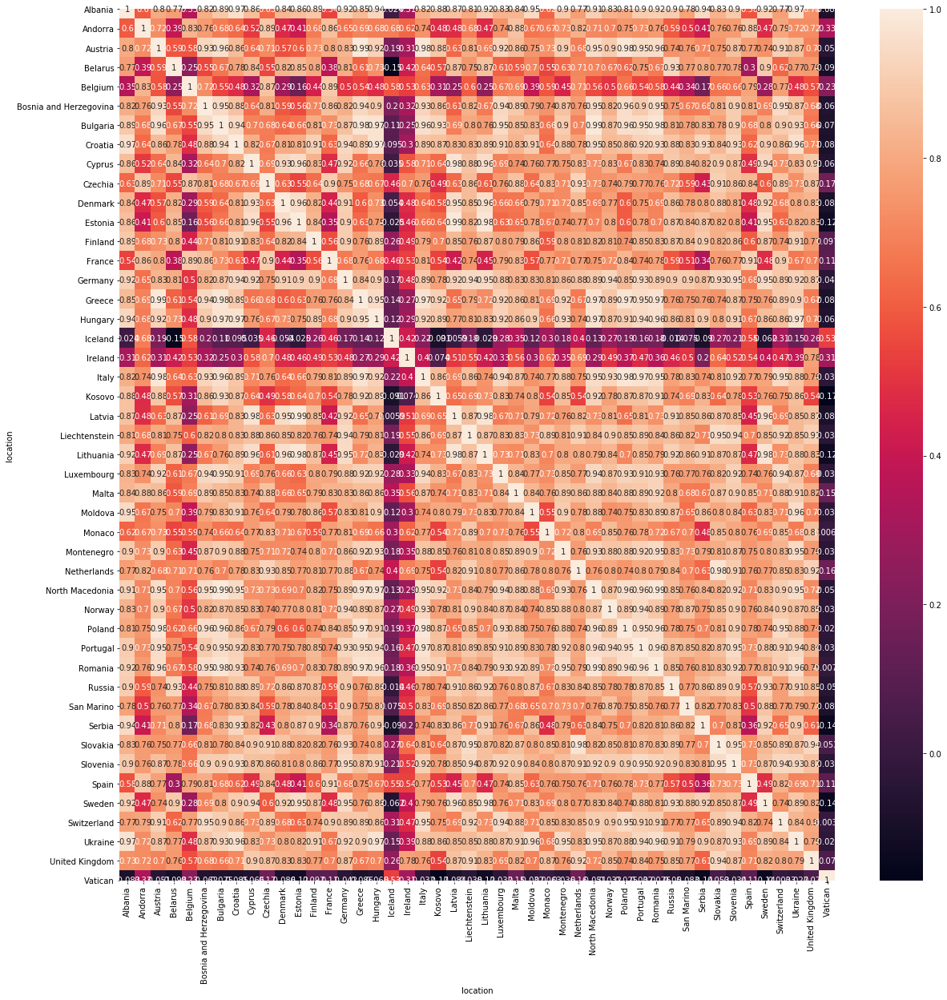

In [767]:
plt.figure(figsize=(20,20))
sn.heatmap(data1_cases['new_cases_smoothed_per_million'].corr(), annot=True)

/Users/shinggg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  
/Users/shinggg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log
  


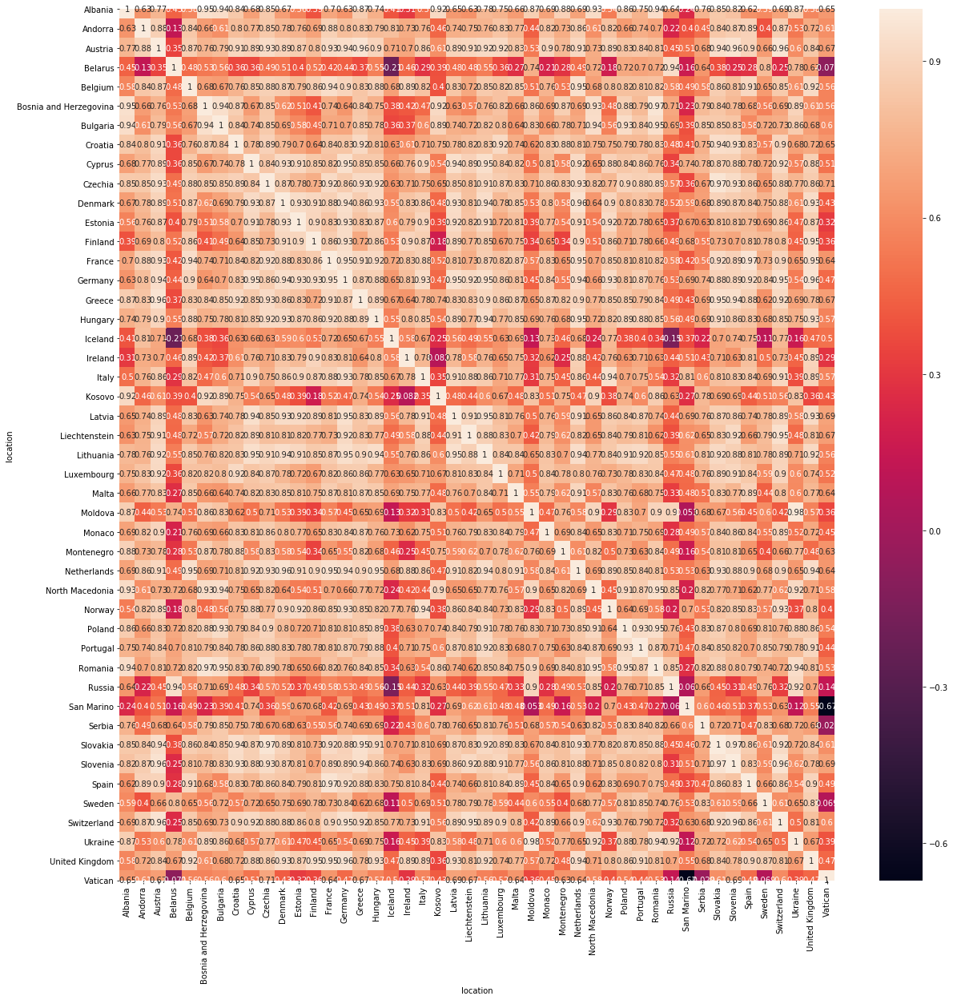

In [768]:
plt.figure(figsize=(20,20))
sn.heatmap(np.log(data1_cases['new_cases_smoothed_per_million']).corr(), annot=True)

# Split dates into first and second half

In [769]:
half_len = len(data1_cases.index)//2

In [770]:
data1_cases.index[half_len+1]

Timestamp('2020-07-16 00:00:00')

In [771]:
data1_cases.index[half_len+1]

Timestamp('2020-07-16 00:00:00')

## First half

In [772]:
data1_cases[:half_len]['new_cases_smoothed_per_million'].corr()

location,Albania,Andorra,Austria,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,Finland,France,Germany,Greece,Hungary,Iceland,Ireland,Italy,Kosovo,Latvia,Liechtenstein,Lithuania,Luxembourg,Malta,Moldova,Monaco,Montenegro,Netherlands,North Macedonia,Norway,Poland,Portugal,Romania,Russia,San Marino,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Ukraine,United Kingdom,Vatican
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Albania,1.000000,-0.356548,-0.241222,-0.177982,-0.414066,0.865109,0.923424,0.439233,-0.352627,0.082262,-0.496676,-0.434885,-0.608227,-0.229122,-0.358836,-0.116944,-0.493190,-0.303946,-0.402398,-0.511675,0.926564,-0.446028,-0.276583,-0.325318,-0.094339,-0.489889,0.735761,-0.207246,0.766987,-0.432916,0.886940,-0.408406,0.105806,0.011281,0.605117,0.198593,-0.577626,0.397836,-0.058311,-0.095360,-0.353972,0.419052,-0.317279,0.785032,-0.538877,-0.297913
Andorra,-0.356548,1.000000,0.890153,-0.497395,0.709687,-0.232134,-0.440513,0.511673,0.811990,0.784770,0.680908,0.885130,0.564149,0.419775,0.926392,0.834238,0.371814,0.893186,0.438255,0.848177,-0.386802,0.865862,0.626084,0.849353,0.868915,0.675692,-0.549616,0.898822,-0.057903,0.792921,-0.298978,0.857136,-0.170411,0.694943,-0.062124,-0.634266,0.486619,0.028379,0.497820,0.790415,0.919196,-0.305572,0.912514,-0.580180,0.455645,0.663854
Austria,-0.241222,0.890153,1.000000,-0.587104,0.551086,-0.125826,-0.294333,0.593945,0.659972,0.781055,0.532684,0.818109,0.422384,0.313702,0.886871,0.885226,0.166983,0.952485,0.240728,0.860949,-0.260806,0.879511,0.785119,0.764602,0.962230,0.560364,-0.592074,0.916724,0.080053,0.648659,-0.261440,0.926120,-0.381337,0.536727,-0.069427,-0.596456,0.408049,-0.076970,0.360007,0.872069,0.872877,-0.336858,0.961944,-0.585659,0.298587,0.743016
Belarus,-0.177982,-0.497395,-0.587104,1.000000,-0.180060,-0.204282,-0.089186,-0.561397,-0.517302,-0.510099,-0.215128,-0.490217,0.019327,-0.157368,-0.478293,-0.626149,0.137927,-0.655872,-0.012520,-0.545114,-0.253993,-0.410514,-0.607040,-0.346195,-0.633310,-0.314730,0.419290,-0.589351,-0.571152,-0.258504,0.130246,-0.640818,0.731141,-0.194405,0.220307,0.910637,-0.283484,-0.137660,-0.444961,-0.873357,-0.479644,0.627982,-0.622445,0.480403,0.204562,-0.330151
Belgium,-0.414066,0.709687,0.551086,-0.180060,1.000000,-0.197278,-0.408463,0.467969,0.886582,0.656718,0.914825,0.802715,0.916150,0.653584,0.860027,0.670431,0.859023,0.557204,0.895727,0.791874,-0.386545,0.792664,0.228302,0.846073,0.576421,0.701960,-0.487204,0.611042,-0.161009,0.981784,-0.334608,0.618743,0.166207,0.835779,0.346773,-0.146438,0.726129,0.472752,0.816796,0.560919,0.859196,0.122967,0.662773,-0.421601,0.904460,0.514834
Bosnia and Herzegovina,0.865109,-0.232134,-0.125826,-0.204282,-0.197278,1.000000,0.943274,0.646163,-0.177138,0.203667,-0.292968,-0.278495,-0.336691,-0.090568,-0.193006,0.033886,-0.235346,-0.211331,-0.183676,-0.346344,0.934514,-0.209674,-0.204864,-0.192670,0.066573,-0.331454,0.456832,-0.087384,0.939305,-0.242909,0.674639,-0.309417,0.101971,0.154416,0.747279,0.146590,-0.403387,0.622127,0.116089,0.070041,-0.187259,0.137774,-0.178565,0.641405,-0.274526,-0.176101
Bulgaria,0.923424,-0.440513,-0.294333,-0.089186,-0.408463,0.943274,1.000000,0.443912,-0.406870,-0.013282,-0.501945,-0.494582,-0.528806,-0.243356,-0.413549,-0.156113,-0.395692,-0.382509,-0.351531,-0.528124,0.956923,-0.417532,-0.298459,-0.385045,-0.125551,-0.513870,0.619565,-0.292968,0.834897,-0.453580,0.776048,-0.470404,0.120697,-0.051639,0.685026,0.292466,-0.521678,0.489818,-0.053022,-0.141449,-0.413070,0.275092,-0.371118,0.769594,-0.445166,-0.276559
Croatia,0.439233,0.511673,0.593945,-0.561397,0.467969,0.646163,0.443912,1.000000,0.515518,0.818070,0.368810,0.476635,0.261336,0.344460,0.591246,0.698745,0.157486,0.513071,0.284886,0.440610,0.467639,0.508695,0.312630,0.529243,0.730430,0.285799,-0.118824,0.626203,0.754817,0.474495,0.268415,0.455208,-0.122496,0.667504,0.588178,-0.339611,0.154071,0.617925,0.570230,0.710588,0.590937,-0.089378,0.5854

In [775]:
np.log(data1_cases[:half_len]['new_cases_smoothed_per_million']).corr()

/Users/shinggg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.
/Users/shinggg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log
  """Entry point for launching an IPython kernel.


location,Albania,Andorra,Austria,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,Finland,France,Germany,Greece,Hungary,Iceland,Ireland,Italy,Kosovo,Latvia,Liechtenstein,Lithuania,Luxembourg,Malta,Moldova,Monaco,Montenegro,Netherlands,North Macedonia,Norway,Poland,Portugal,Romania,Russia,San Marino,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Ukraine,United Kingdom,Vatican
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Albania,1.000000,-0.229171,-0.226553,0.255837,-0.483703,0.802325,0.814367,0.206188,-0.507588,0.251644,-0.619808,-0.639705,-0.741058,-0.277416,-0.422763,0.010558,-0.514990,-0.230293,-0.597667,-0.673829,0.888020,-0.588805,-0.521904,-0.344097,0.017189,-0.692503,0.643301,-0.067313,0.562994,-0.516648,0.862965,-0.540526,0.378351,0.360159,0.584380,0.425281,-0.727022,0.500159,0.085949,0.092799,-0.450455,0.521830,-0.271316,0.580202,-0.482984,-0.042837
Andorra,-0.229171,1.000000,0.779798,-0.422268,0.690372,-0.008137,-0.437969,0.554773,0.805414,0.692193,0.659256,0.802244,0.601897,0.689160,0.796738,0.682846,0.458889,0.741582,0.629612,0.751779,-0.273774,0.715831,0.524119,0.630285,0.741841,0.462660,-0.481304,0.714340,0.538166,0.767168,-0.041809,0.780817,-0.287833,0.473428,0.116055,-0.396317,0.608978,0.180200,0.612933,0.741094,0.766837,-0.226400,0.786239,-0.315635,0.448976,0.365717
Austria,-0.226553,0.779798,1.000000,-0.268007,0.751662,0.037262,-0.319041,0.697705,0.756843,0.736229,0.690261,0.753767,0.652038,0.788218,0.907897,0.904662,0.335760,0.737826,0.559448,0.698182,-0.293406,0.746094,0.827329,0.656871,0.907654,0.502257,-0.574789,0.869448,0.394604,0.731366,0.167260,0.799213,-0.114968,0.409534,0.416937,0.013720,0.444187,0.078915,0.713514,0.810027,0.891530,0.274771,0.915582,-0.361755,0.588186,0.564811
Belarus,0.255837,-0.422268,-0.268007,1.000000,0.273701,0.522057,0.453324,-0.077514,-0.427811,0.234802,0.171122,-0.102198,0.249462,0.101573,-0.032707,-0.227356,0.366824,-0.684274,0.264812,-0.390191,0.306177,-0.055270,-0.673631,0.156902,-0.012842,-0.219450,0.864238,-0.493759,-0.381971,0.171331,0.710466,-0.486815,0.849560,0.579035,0.790049,0.965165,-0.300080,0.569904,-0.284195,-0.637105,-0.051581,0.879434,-0.424946,0.881643,0.557705,-0.542507
Belgium,-0.483703,0.690372,0.751662,0.273701,1.000000,0.085978,-0.364967,0.486157,0.897359,0.632540,0.911745,0.822404,0.926827,0.914435,0.936871,0.674848,0.917430,0.388175,0.969606,0.773789,-0.500925,0.865465,0.232387,0.888712,0.688670,0.742308,-0.190824,0.463036,-0.229548,0.971354,0.285295,0.671727,0.349892,0.629520,0.667260,0.429878,0.558553,0.409087,0.614443,0.356572,0.917108,0.607686,0.686459,0.048649,0.956284,0.064961
Bosnia and Herzegovina,0.802325,-0.008137,0.037262,0.522057,0.085978,1.000000,0.880200,0.501187,-0.212613,0.595206,-0.265158,-0.310293,-0.201136,0.097253,0.013545,0.172234,0.148429,-0.206771,-0.002783,-0.380594,0.841062,-0.070730,-0.376151,0.160373,0.393809,-0.408415,0.710302,0.077179,0.561811,-0.056916,0.833455,-0.382920,0.723241,0.748776,0.896887,0.665827,-0.415615,0.865196,0.351143,0.149199,-0.055739,0.627540,-0.018326,0.729534,0.170403,0.002126
Bulgaria,0.814367,-0.437969,-0.319041,0.453324,-0.364967,0.880200,1.000000,0.270828,-0.527703,0.152007,-0.582947,-0.685814,-0.601367,-0.308641,-0.425004,-0.065636,-0.288443,-0.425922,-0.417257,-0.640038,0.862547,-0.449822,-0.563683,-0.275680,0.000658,-0.623814,0.712652,-0.200205,0.284744,-0.474566,0.767767,-0.604654,0.519025,0.363279,0.709095,0.620437,-0.590805,0.646600,0.079053,-0.033759,-0.485747,0.548798,-0.313460,0.716995,-0.271144,-0.349423
Croatia,0.206188,0.554773,0.697705,-0.077514,0.486157,0.501187,0.270828,1.000000,0.386888,0.686870,0.406040,0.247450,0.321869,0.552110,0.636123,0.700196,0.228379,0.516541,0.385106,0.399363,0.250577,0.441880,0.164216,0.360348,0.830527,0.088356,-0.152981,0.591055,0.785998,0.405744,0.234068,0.454469,0.075112,0.442870,0.435530,0.089671,0.224772,0.512348,0.883858,0.783542,0.592047,0.167405,0.744712,0.007641,0.359256,0.310546
Cyprus,-0.507588,0.

In [776]:
data1.location.unique()

array(['Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium',
       'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus',
       'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
       'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo',
       'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta',
       'Moldova', 'Monaco', 'Montenegro', 'Netherlands',
       'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania',
       'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain',
       'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican'],
      dtype=object)

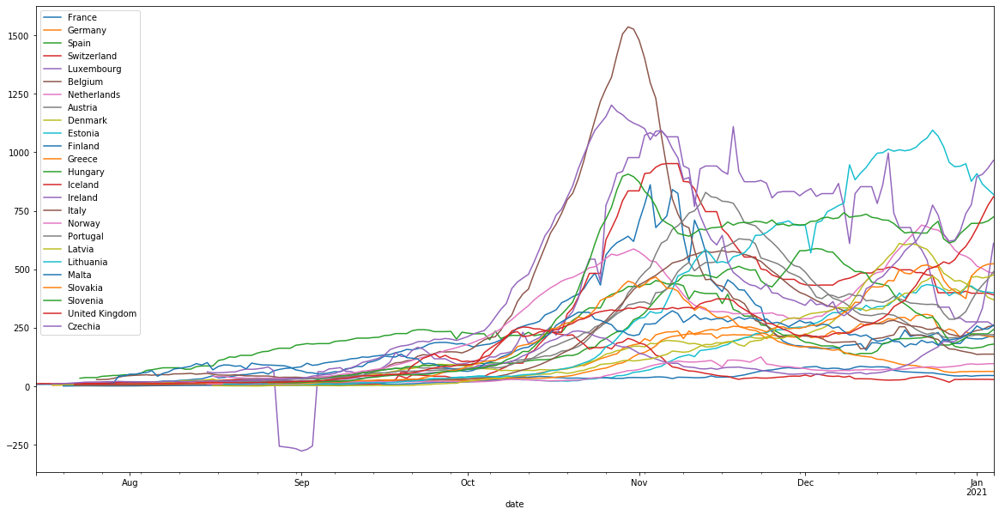

In [777]:
plt.figure(figsize=(20,10))
countries = ['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands','Austria','Denmark',
             'Estonia','Finland','Greece','Hungary','Iceland','Ireland','Italy','Norway','Portugal','Latvia',
             'Lithuania','Malta','Slovakia','Slovenia','United Kingdom','Czechia']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'][half_len:].plot()

plt.legend(['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands','Austria','Denmark',
             'Estonia','Finland','Greece','Hungary','Iceland','Ireland','Italy','Norway','Portugal','Latvia',
             'Lithuania','Malta','Slovakia', 'Slovenia','United Kingdom','Czechia'])

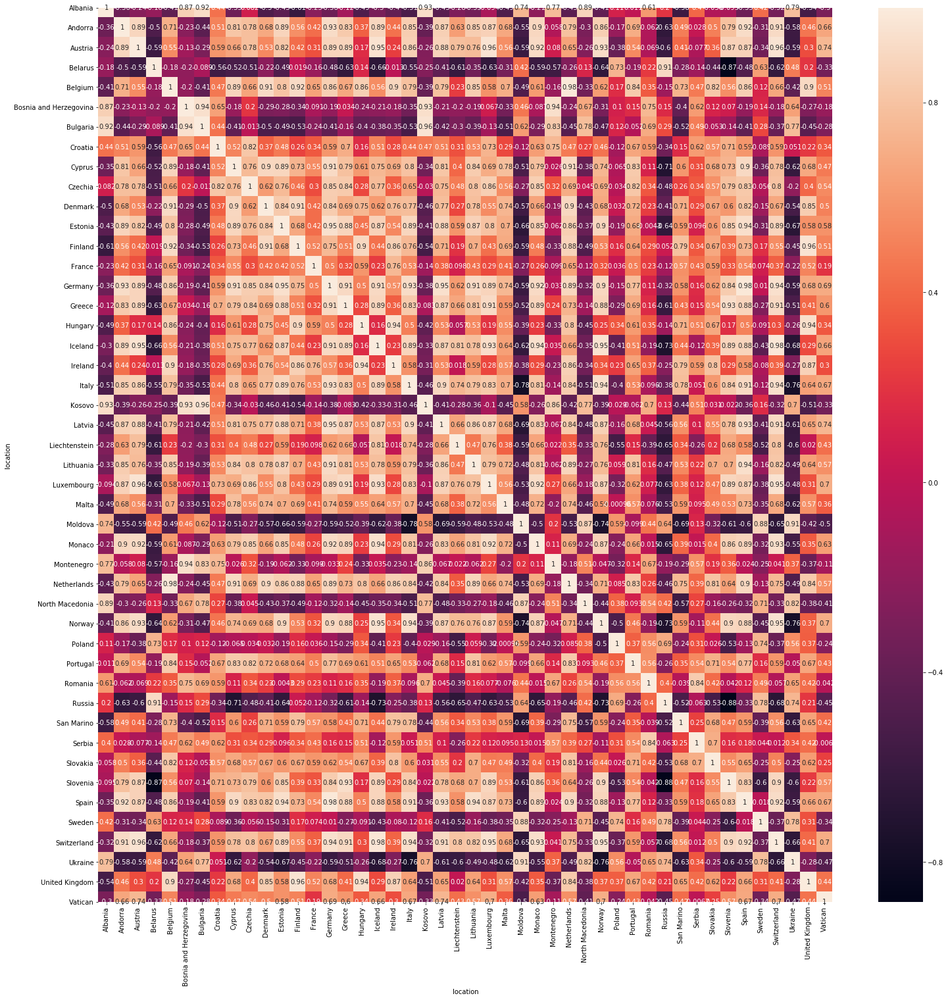

In [778]:
plt.figure(figsize=(25,25))
sn.heatmap(data1_cases[:half_len]['new_cases_smoothed_per_million'].corr(), annot=True)

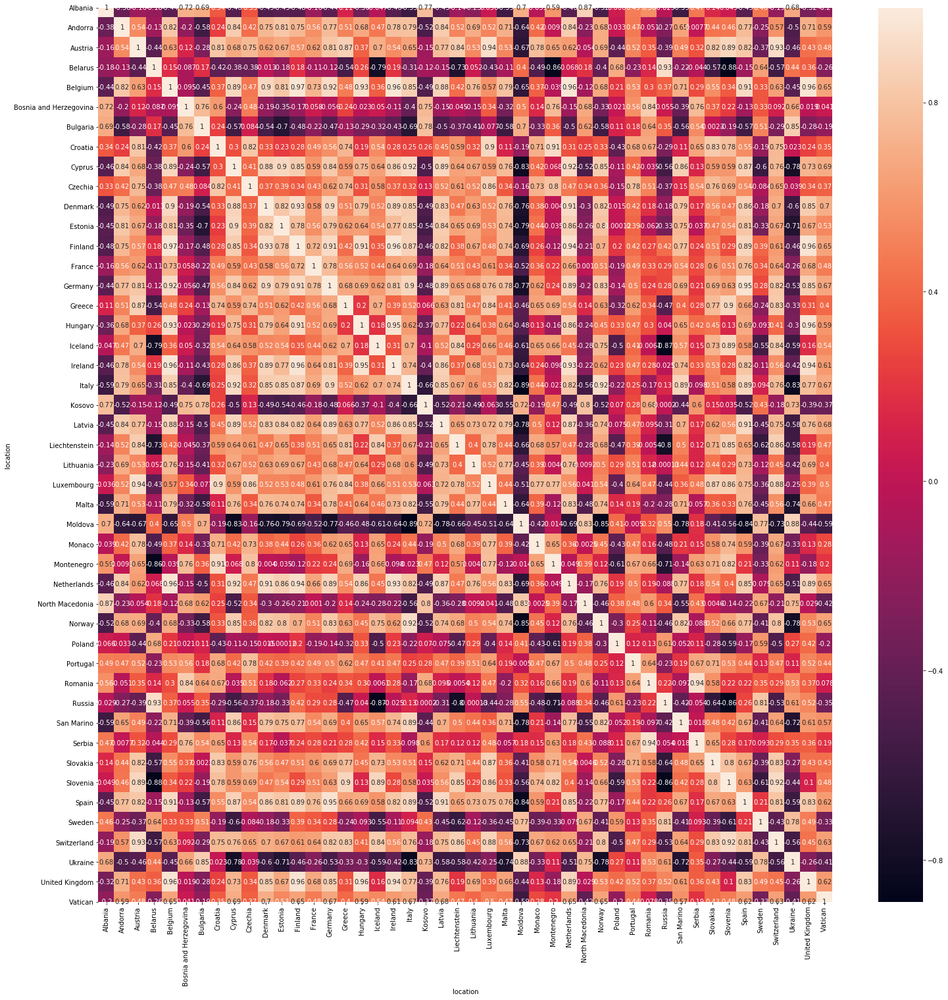

In [779]:
plt.figure(figsize=(25,25))
sn.heatmap(data1_cases[:half_len]['new_cases_smoothed_per_million'].corr('spearman'), annot=True)

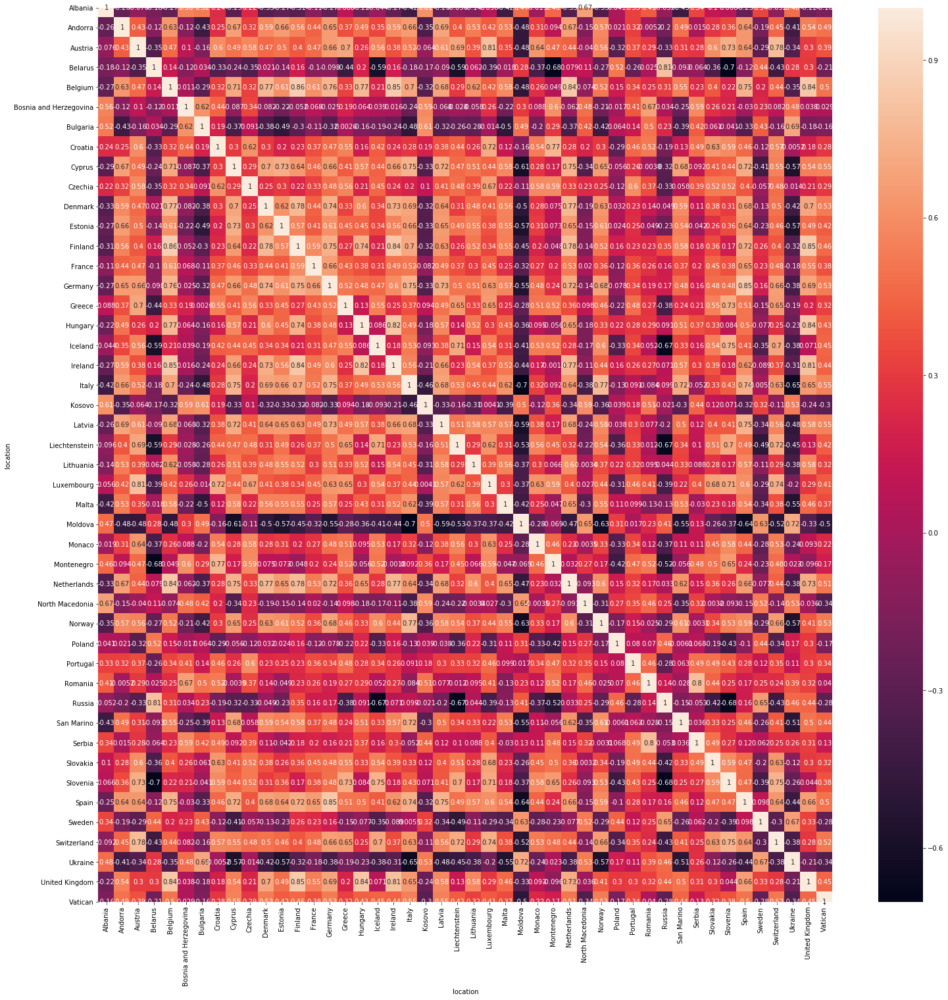

In [780]:
plt.figure(figsize=(25,25))
sn.heatmap(data1_cases[:half_len]['new_cases_smoothed_per_million'].corr('kendall'), annot=True)

## Second half:

In [781]:
data1_cases[half_len:]['new_cases_smoothed_per_million'].corr()

location,Albania,Andorra,Austria,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,Finland,France,Germany,Greece,Hungary,Iceland,Ireland,Italy,Kosovo,Latvia,Liechtenstein,Lithuania,Luxembourg,Malta,Moldova,Monaco,Montenegro,Netherlands,North Macedonia,Norway,Poland,Portugal,Romania,Russia,San Marino,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Ukraine,United Kingdom,Vatican
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Albania,1.000000,0.398327,0.741829,0.926129,0.156183,0.699039,0.856941,0.962798,0.833542,0.437843,0.802994,0.858414,0.934671,0.333816,0.919467,0.791582,0.922160,-0.114786,0.234594,0.791442,0.819414,0.852714,0.744400,0.911770,0.789677,0.735244,0.933645,0.505304,0.832751,0.653121,0.875650,0.836169,0.735436,0.876745,0.865497,0.926782,0.906493,0.964896,0.742857,0.856573,0.317317,0.940550,0.696575,0.955082,0.641851,-0.098748
Andorra,0.398327,1.000000,0.621521,0.435870,0.818696,0.661250,0.571772,0.495850,0.354866,0.856897,0.277278,0.219831,0.579769,0.826309,0.504382,0.573288,0.561556,0.781921,0.623466,0.653697,0.273745,0.309474,0.567962,0.290676,0.635421,0.823444,0.509379,0.536075,0.589555,0.737557,0.604010,0.575550,0.678945,0.624312,0.648147,0.533240,0.454836,0.242467,0.670233,0.675079,0.814925,0.342923,0.712640,0.593752,0.623407,0.387004
Austria,0.741829,0.621521,1.000000,0.641443,0.475333,0.933020,0.957611,0.809964,0.541399,0.608174,0.443166,0.488989,0.672921,0.735665,0.783208,0.989823,0.895301,0.095950,0.218586,0.984044,0.864596,0.519758,0.745601,0.603071,0.897085,0.828636,0.691012,0.659454,0.897223,0.559149,0.953305,0.899956,0.983249,0.936271,0.962470,0.713928,0.791970,0.641475,0.658867,0.820868,0.713361,0.685218,0.884306,0.839975,0.597779,-0.079194
Belarus,0.926129,0.435870,0.641443,1.000000,0.205793,0.613992,0.730449,0.882929,0.953868,0.580616,0.927914,0.961725,0.918066,0.358116,0.957637,0.663722,0.819184,-0.035092,0.478427,0.727778,0.647025,0.975834,0.863046,0.979689,0.713640,0.720035,0.868119,0.654357,0.789132,0.813507,0.778250,0.857567,0.667121,0.846289,0.769988,0.988297,0.934162,0.887362,0.880687,0.891899,0.333643,0.972854,0.705163,0.908326,0.837078,-0.062094
Belgium,0.156183,0.818696,0.475333,0.205793,1.000000,0.669966,0.440183,0.341452,0.163436,0.855535,0.112136,-0.026151,0.286608,0.876290,0.351401,0.412295,0.342471,0.691532,0.484519,0.536983,0.134939,0.084174,0.510037,0.077718,0.594988,0.632420,0.185117,0.493337,0.289116,0.635445,0.448007,0.387970,0.578033,0.423829,0.461253,0.301192,0.266930,-0.000928,0.577436,0.582031,0.784778,0.115772,0.720237,0.326265,0.436109,0.250533
Bosnia and Herzegovina,0.699039,0.661250,0.933020,0.613992,0.669966,1.000000,0.940203,0.827640,0.518999,0.712829,0.437356,0.423637,0.656813,0.824234,0.780027,0.920921,0.862023,0.178687,0.225268,0.953603,0.789234,0.481080,0.771187,0.559717,0.946754,0.825771,0.634086,0.674797,0.787119,0.630491,0.930586,0.831645,0.958236,0.870703,0.921096,0.690333,0.751411,0.595181,0.718485,0.867207,0.738422,0.629396,0.959101,0.791725,0.562829,-0.073700
Bulgaria,0.856941,0.571772,0.957611,0.730449,0.440183,0.940203,1.000000,0.923381,0.611275,0.563656,0.530659,0.574374,0.791472,0.646140,0.844051,0.974454,0.960754,0.043822,0.156525,0.966003,0.919011,0.601279,0.740718,0.690908,0.944236,0.815948,0.796726,0.582567,0.888741,0.584608,0.991221,0.877631,0.951587,0.938692,0.983570,0.789697,0.837342,0.789426,0.690412,0.869625,0.585705,0.766941,0.877740,0.907484,0.561065,-0.086470
Croatia,0.962798,0.495850,0.809964,0.882929,0.341452,0.827640,0.923381,1.000000,0.769096,0.536504,0.748402,0.766846,0.925485,0.488534,0.928125,0.847906,0.962181,-0.010918,0.203185,0.860172,0.832762,0.784525,0.780216,0.852866,0.891551,0.771499,0.915208,0.540290,0.840265,0.691480,0.933787,0.845968,0.817264,0.894420,0.914174,0.902664,0.903361,0.923282,0.780361,0.908977,0.444366,0.893108,0.810357,0.961170,0.614901,-0.104180
Cyprus,0.833542,0.354866,0.541399,0.953868,0.163436,0.518999,0.611275,0.769096,1.000000,0.585442,0.915648,0.948291,0.807102

In [782]:
np.log(data1_cases[half_len:]['new_cases_smoothed_per_million']).corr()

/Users/shinggg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.
/Users/shinggg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log
  """Entry point for launching an IPython kernel.


location,Albania,Andorra,Austria,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,Finland,France,Germany,Greece,Hungary,Iceland,Ireland,Italy,Kosovo,Latvia,Liechtenstein,Lithuania,Luxembourg,Malta,Moldova,Monaco,Montenegro,Netherlands,North Macedonia,Norway,Poland,Portugal,Romania,Russia,San Marino,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Ukraine,United Kingdom,Vatican
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Albania,1.000000,0.663865,0.885789,0.934406,0.611611,0.853865,0.904566,0.948422,0.923665,0.744289,0.887810,0.908062,0.867496,0.653000,0.951725,0.883657,0.827116,0.309432,0.608609,0.905788,0.738902,0.918732,0.894639,0.957900,0.853492,0.672206,0.902402,0.734739,0.795076,0.793035,0.919009,0.871379,0.899896,0.912595,0.929439,0.933118,0.903701,0.889979,0.845740,0.895357,0.542246,0.956305,0.902509,0.925975,0.822549,-0.493560
Andorra,0.663865,1.000000,0.892562,0.765674,0.901712,0.654706,0.664358,0.787664,0.708888,0.953424,0.812018,0.775867,0.904669,0.955495,0.811369,0.843948,0.928597,0.804081,0.911332,0.886640,0.136765,0.798651,0.765717,0.786744,0.661280,0.778780,0.807668,0.743814,0.798573,0.925506,0.699737,0.855501,0.822973,0.845009,0.794038,0.719381,0.539923,0.350865,0.919692,0.888039,0.883362,0.659863,0.851030,0.879599,0.913169,0.252922
Austria,0.885789,0.892562,1.000000,0.906559,0.836243,0.875397,0.884408,0.948268,0.855465,0.917385,0.893041,0.884819,0.929121,0.894960,0.950311,0.956156,0.955530,0.572883,0.780358,0.985642,0.530675,0.908073,0.907846,0.934203,0.864901,0.744201,0.898100,0.821406,0.899370,0.899102,0.909834,0.937930,0.952183,0.971707,0.954363,0.882320,0.849458,0.683469,0.941238,0.969399,0.795776,0.874921,0.963632,0.970486,0.929058,-0.682270
Belarus,0.934406,0.765674,0.906559,1.000000,0.696542,0.804983,0.900418,0.939177,0.925404,0.859983,0.917064,0.913345,0.907012,0.718778,0.962998,0.832515,0.876202,0.403340,0.722931,0.930110,0.579562,0.982833,0.933028,0.975363,0.874845,0.612448,0.895687,0.763182,0.876484,0.863806,0.914831,0.864073,0.921676,0.965497,0.914336,0.986680,0.910539,0.829441,0.928458,0.960414,0.565134,0.961536,0.928281,0.936743,0.928376,-0.392704
Belgium,0.611611,0.901712,0.836243,0.696542,1.000000,0.754239,0.730246,0.732131,0.735028,0.918970,0.726938,0.650846,0.816653,0.909255,0.785150,0.793534,0.804525,0.842862,0.839101,0.841474,0.236400,0.753653,0.771164,0.723840,0.724112,0.745143,0.689191,0.743109,0.685854,0.888117,0.744413,0.781376,0.856023,0.793195,0.813818,0.697915,0.533178,0.387771,0.870171,0.842735,0.822390,0.645372,0.859053,0.786752,0.850682,-0.502900
Bosnia and Herzegovina,0.853865,0.654706,0.875397,0.804983,0.754239,1.000000,0.950633,0.891915,0.819254,0.727054,0.707598,0.701260,0.730358,0.696796,0.870111,0.845628,0.742979,0.379056,0.517077,0.880948,0.780045,0.795984,0.861045,0.824865,0.943816,0.607064,0.721731,0.711997,0.716533,0.704184,0.944809,0.777030,0.917614,0.867820,0.930242,0.826354,0.844997,0.807470,0.768439,0.844151,0.579265,0.833184,0.913329,0.816037,0.734600,-0.644224
Bulgaria,0.904566,0.664358,0.884408,0.900418,0.730246,0.950633,1.000000,0.905293,0.885471,0.754366,0.764348,0.759024,0.792492,0.649918,0.906850,0.823555,0.766882,0.361545,0.536711,0.891839,0.779360,0.893488,0.902132,0.886523,0.975782,0.553785,0.797773,0.691204,0.803623,0.739773,0.991513,0.776672,0.951158,0.921397,0.961295,0.931186,0.905552,0.886747,0.817144,0.887717,0.490388,0.925152,0.915730,0.854478,0.801313,-0.579629
Croatia,0.948422,0.787664,0.948268,0.939177,0.732131,0.891915,0.905293,1.000000,0.884204,0.838816,0.882318,0.884069,0.901032,0.792620,0.968169,0.919117,0.898922,0.422583,0.701772,0.968463,0.634411,0.919746,0.945019,0.953153,0.886858,0.688487,0.901495,0.775817,0.820438,0.851202,0.927120,0.897582,0.935714,0.951525,0.942488,0.919206,0.943901,0.790578,0.912092,0.955004,0.675657,0.908890,0.962195,0.958008,0.880255,-0.545634
Cyprus,0.923665,0.708888,0.855465,0.925404,0.735028,0.819254,0.885471,0.884204,1.000000,0.816005,0.895894,0.884407,0.874619,0.6

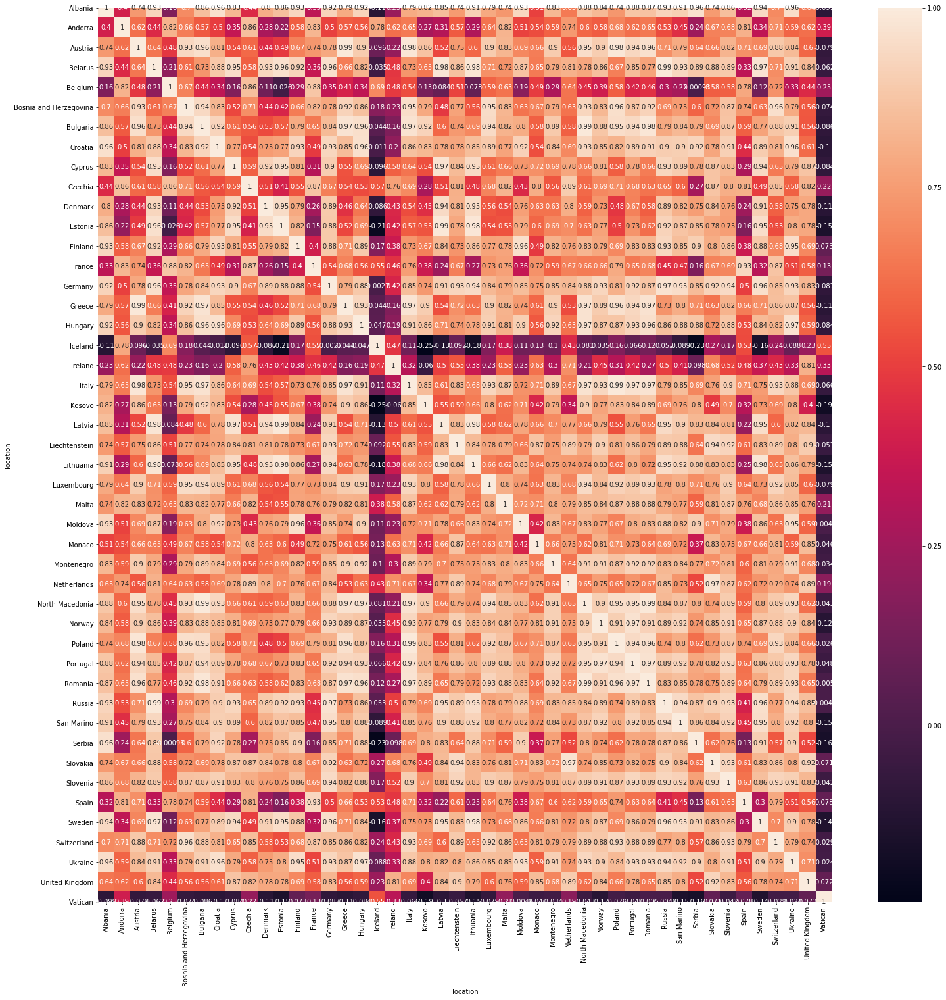

In [783]:
plt.figure(figsize=(25,25))
sn.heatmap(data1_cases[half_len:]['new_cases_smoothed_per_million'].corr(), annot=True)

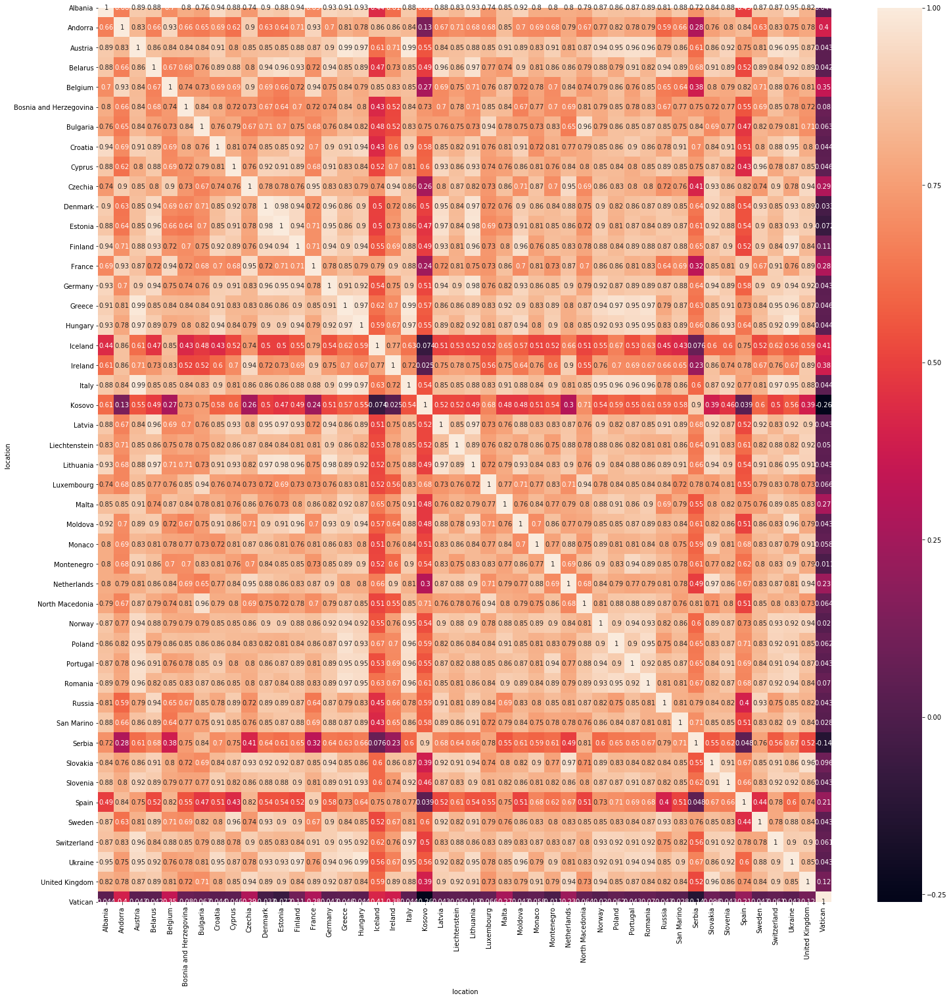

In [784]:
plt.figure(figsize=(25,25))
sn.heatmap(data1_cases[half_len:]['new_cases_smoothed_per_million'].corr('spearman'), annot=True)

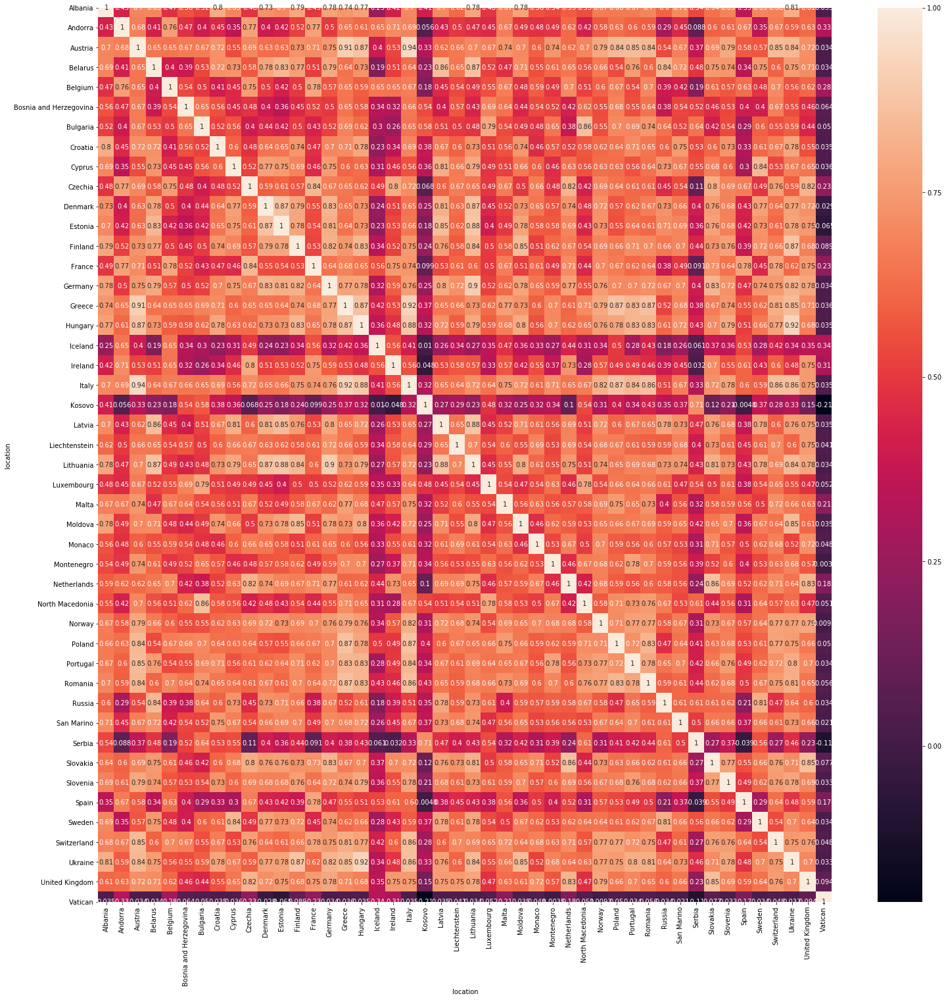

In [785]:
plt.figure(figsize=(25,25))
sn.heatmap(data1_cases[half_len:]['new_cases_smoothed_per_million'].corr('kendall'), annot=True)

# Correlation after mid-Sep

In [786]:
data1_cases[data1_cases.index >= '09-15-2020']['new_cases_smoothed_per_million'].corr('spearman')

location,Albania,Andorra,Austria,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,Finland,France,Germany,Greece,Hungary,Iceland,Ireland,Italy,Kosovo,Latvia,Liechtenstein,Lithuania,Luxembourg,Malta,Moldova,Monaco,Montenegro,Netherlands,North Macedonia,Norway,Poland,Portugal,Romania,Russia,San Marino,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Ukraine,United Kingdom,Vatican
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Albania,1.000000,-0.052954,0.739403,0.856154,0.092473,0.631943,0.793265,0.966861,0.839318,0.161083,0.813352,0.767910,0.909685,0.023965,0.843476,0.775395,0.885546,-0.603083,-0.226479,0.716510,0.874813,0.828610,0.552738,0.865502,0.669772,0.496297,0.858431,0.464854,0.710272,0.384370,0.802593,0.684074,0.676127,0.800539,0.800975,0.856558,0.820614,0.972740,0.545622,0.727169,-0.324573,0.892931,0.618615,0.941873,0.462296,-0.243894
Andorra,-0.052954,1.000000,0.372381,-0.163368,0.854688,0.454534,0.331959,0.052409,-0.128982,0.630037,-0.322293,-0.325679,-0.052337,0.730694,-0.101098,0.331835,0.189351,0.654842,0.486158,0.400457,0.089936,-0.145026,0.117681,-0.170228,0.399449,0.602800,-0.098074,0.154141,-0.023472,0.232493,0.297140,0.169414,0.457294,0.250169,0.316689,-0.163739,0.009210,-0.052078,0.116586,0.290032,0.556928,-0.105614,0.404824,0.065170,0.188723,0.451680
Austria,0.739403,0.372381,1.000000,0.555674,0.519037,0.944383,0.977782,0.800976,0.548413,0.439198,0.511617,0.487277,0.589513,0.513809,0.651579,0.990909,0.900314,-0.220991,-0.068990,0.993619,0.910706,0.545351,0.642278,0.561041,0.930788,0.780562,0.603390,0.624929,0.813448,0.309922,0.974465,0.843707,0.984445,0.936635,0.972179,0.554917,0.712214,0.717770,0.490041,0.728012,0.307380,0.609092,0.884457,0.828988,0.554507,-0.246326
Belarus,0.856154,-0.163368,0.555674,1.000000,-0.004724,0.433898,0.579523,0.784589,0.980242,0.337634,0.950044,0.942388,0.871405,0.051201,0.915777,0.584433,0.699599,-0.633866,0.106862,0.546628,0.666042,0.987832,0.753236,0.992588,0.506632,0.322959,0.733513,0.623345,0.573673,0.644063,0.595920,0.695904,0.496499,0.677548,0.589992,0.981090,0.860658,0.874092,0.785282,0.666006,-0.396088,0.959052,0.508036,0.799225,0.706317,-0.248665
Belgium,0.092473,0.854688,0.519037,-0.004724,1.000000,0.630588,0.481614,0.230317,-0.016764,0.733742,-0.124543,-0.190660,0.034143,0.862302,0.147146,0.481180,0.310038,0.547678,0.465728,0.542280,0.245085,-0.028620,0.360612,0.006838,0.600101,0.627847,0.039528,0.330959,0.078801,0.451333,0.464178,0.301453,0.603240,0.327293,0.478215,-0.014893,0.094329,0.068738,0.325556,0.368826,0.594792,0.028270,0.660980,0.187494,0.361662,0.356978
Bosnia and Herzegovina,0.631943,0.454534,0.944383,0.433898,0.630588,1.000000,0.910872,0.724831,0.435389,0.550714,0.407353,0.331532,0.451677,0.603347,0.570130,0.920069,0.808735,-0.107213,-0.016033,0.942922,0.831571,0.421636,0.637733,0.446288,0.957166,0.805031,0.428833,0.667143,0.657073,0.385878,0.903266,0.753258,0.960006,0.815475,0.898640,0.442837,0.580265,0.606684,0.512340,0.729395,0.420831,0.478727,0.936088,0.702600,0.520894,-0.172096
Bulgaria,0.793265,0.331959,0.977782,0.579523,0.481614,0.910872,1.000000,0.843810,0.566023,0.362917,0.536961,0.502810,0.646408,0.455933,0.680006,0.989884,0.929836,-0.264719,-0.118534,0.975689,0.937977,0.563118,0.581349,0.590674,0.896093,0.777252,0.677847,0.556061,0.813943,0.279760,0.986975,0.822099,0.965584,0.943759,0.993978,0.587095,0.704957,0.768215,0.447758,0.716066,0.217197,0.634562,0.844517,0.876260,0.504040,-0.208694
Croatia,0.966861,0.052409,0.800976,0.784589,0.230317,0.724831,0.843810,1.000000,0.760827,0.191915,0.750500,0.691200,0.882643,0.089212,0.812473,0.829122,0.934548,-0.462531,-0.267715,0.778958,0.878341,0.746064,0.532977,0.799220,0.764787,0.524365,0.865539,0.436767,0.708381,0.371782,0.850996,0.645841,0.750641,0.798960,0.851771,0.786339,0.787112,0.954458,0.534100,0.775254,-0.243166,0.834293,0.698812,0.951739,0.401197,-0.243893
Cyprus,0.839318,-0.128982,0.548413,0.980242,-0.016764,0.435389,0.566023,0.760827,1.000000,0

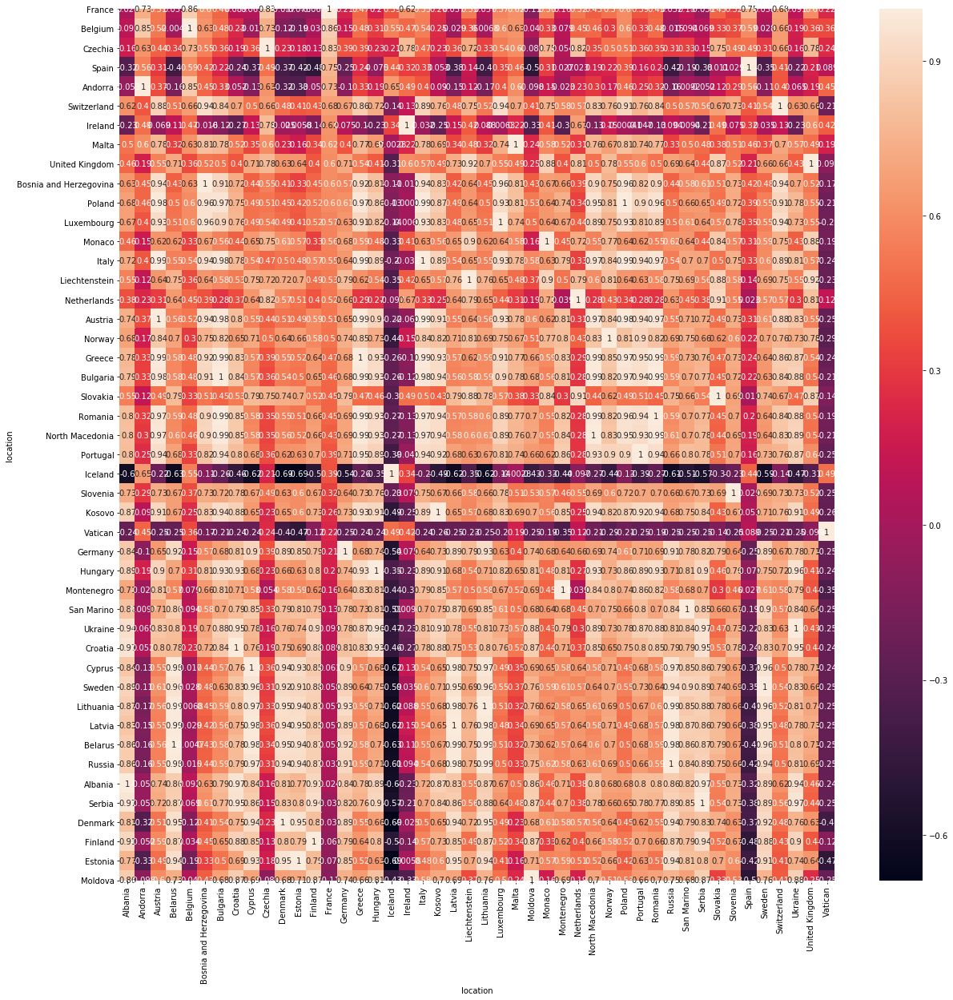

In [787]:
plt.figure(figsize=(20,20))
sn.heatmap(data1_cases[data1_cases.index >= '09-15-2020']['new_cases_smoothed_per_million'].corr('spearman').sort_values('France',ascending=False), annot=True)

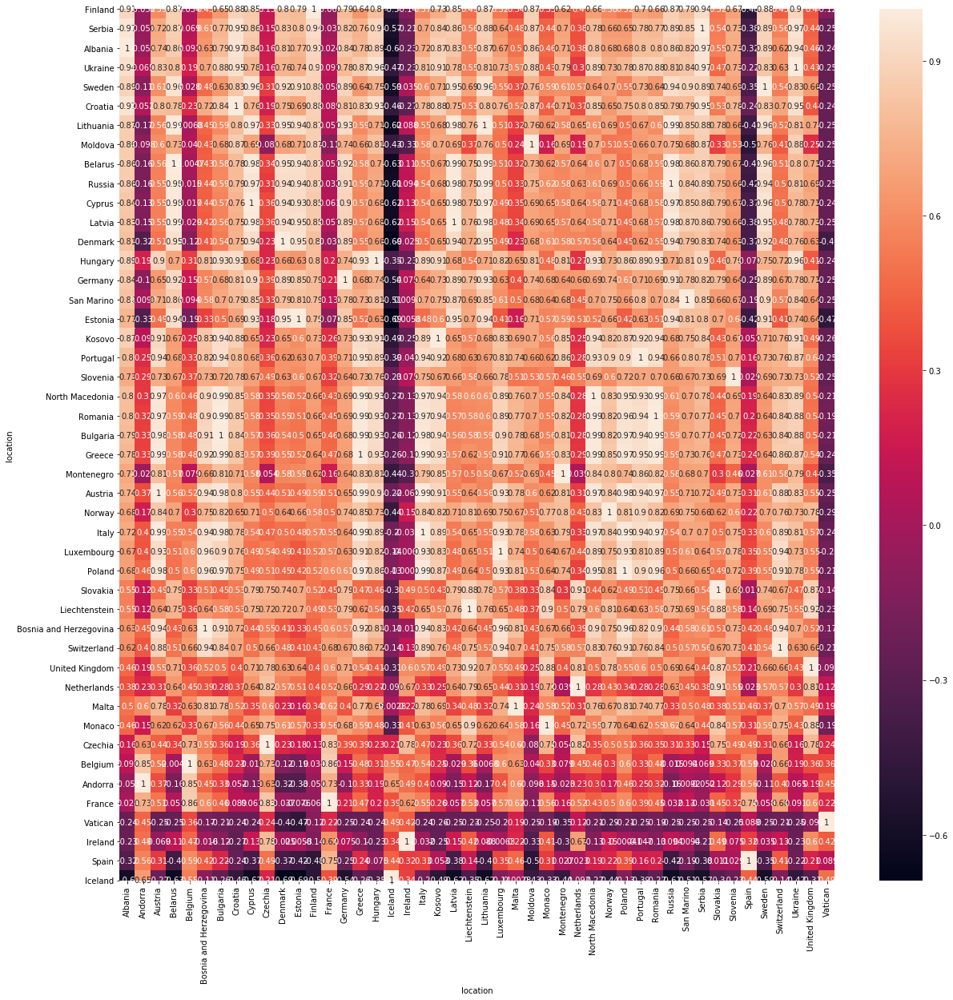

In [788]:
plt.figure(figsize=(20,20))
sn.heatmap(data1_cases[data1_cases.index >= '09-15-2020']['new_cases_smoothed_per_million'].corr('spearman').sort_values('Finland',ascending=False), annot=True)

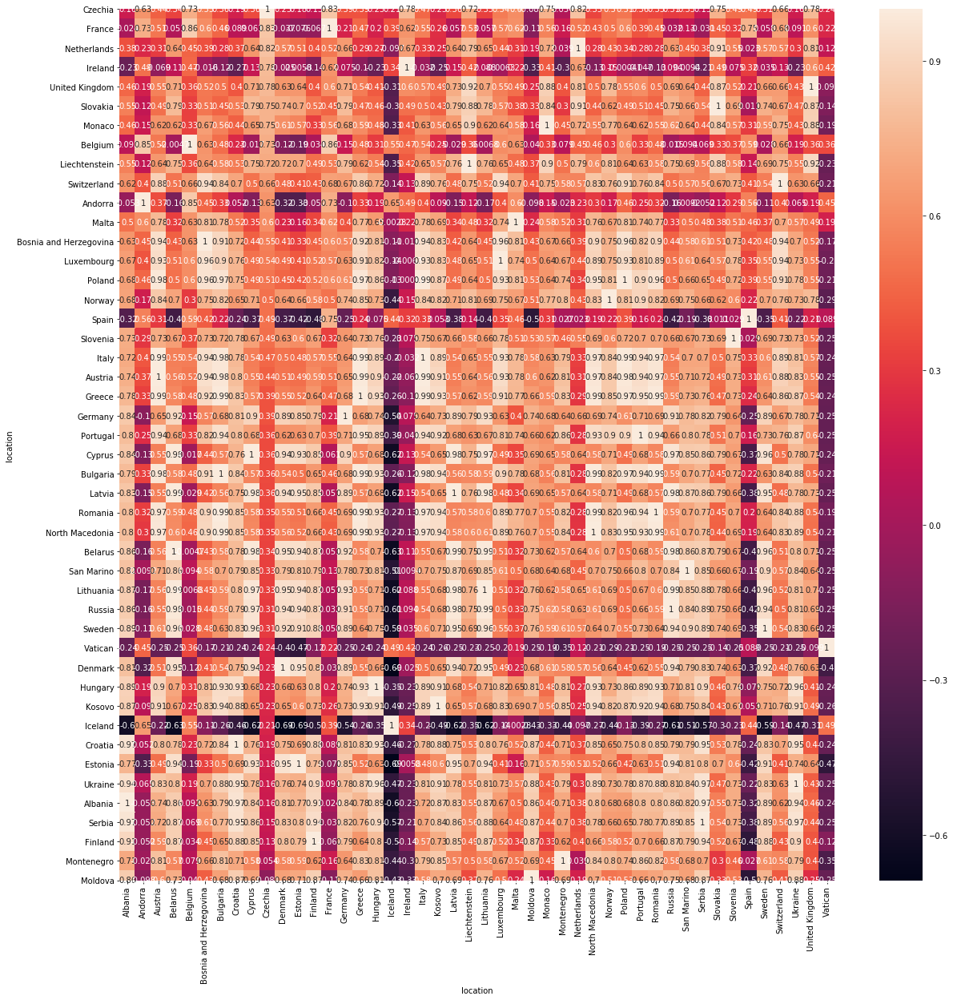

In [789]:
plt.figure(figsize=(20,20))
sn.heatmap(data1_cases[data1_cases.index >= '09-15-2020']['new_cases_smoothed_per_million'].corr('spearman').sort_values('Czechia',ascending=False), annot=True)

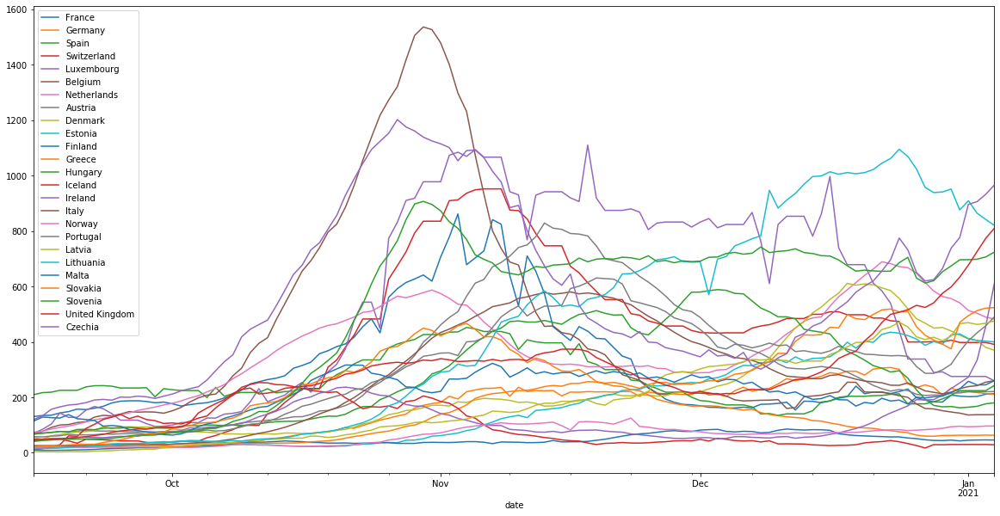

In [790]:
plt.figure(figsize=(20,10))
countries = ['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands','Austria','Denmark',
             'Estonia','Finland','Greece','Hungary','Iceland','Ireland','Italy','Norway','Portugal','Latvia',
             'Lithuania','Malta','Slovakia','Slovenia','United Kingdom','Czechia']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'][data1[data1.location == c].index >= '09-15-2020'].plot()

plt.legend(['France','Germany','Spain','Switzerland','Luxembourg','Belgium','Netherlands','Austria','Denmark',
             'Estonia','Finland','Greece','Hungary','Iceland','Ireland','Italy','Norway','Portugal','Latvia',
             'Lithuania','Malta','Slovakia', 'Slovenia','United Kingdom','Czechia'])

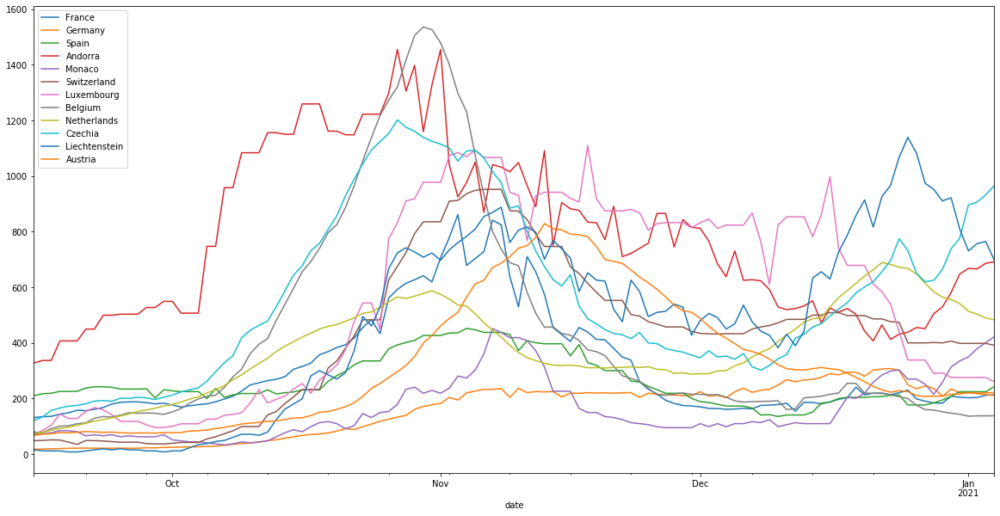

In [791]:
plt.figure(figsize=(20,10))
countries = ['France','Germany','Spain','Andorra','Monaco','Switzerland','Luxembourg','Belgium','Netherlands', 'Czechia','Liechtenstein','Austria']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'][data1[data1.location == c].index >= '09-15-2020'].plot()

plt.legend(['France','Germany','Spain','Andorra','Monaco','Switzerland','Luxembourg','Belgium','Netherlands','Czechia','Liechtenstein','Austria'])

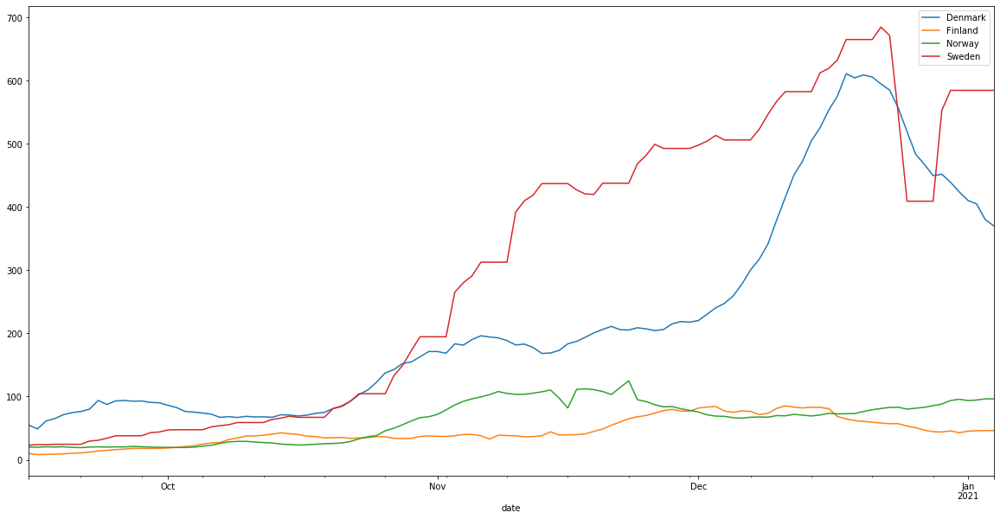

In [792]:
plt.figure(figsize=(20,10))
countries = ['Denmark','Finland','Norway','Sweden']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'][data1[data1.location == c].index >= '09-15-2020'].plot()

plt.legend(['Denmark','Finland','Norway','Sweden'])

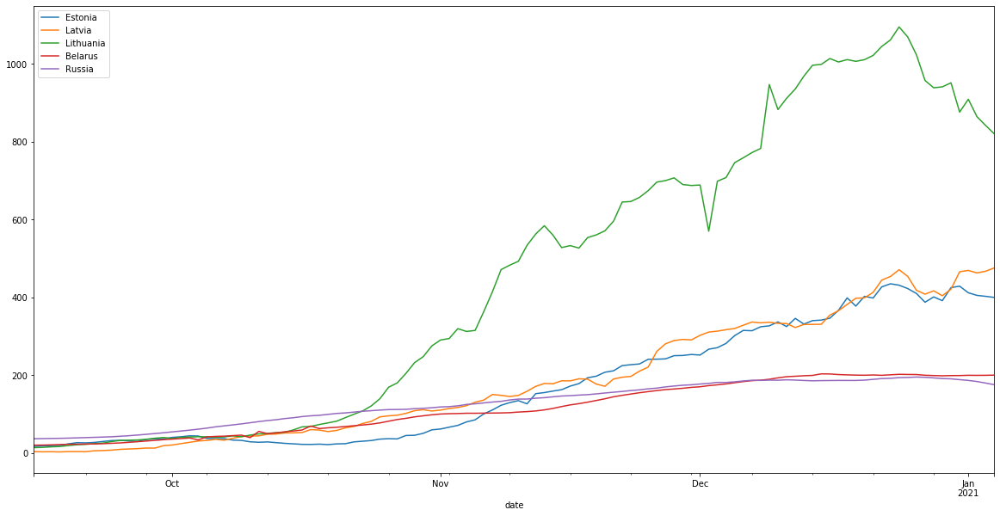

In [793]:
plt.figure(figsize=(20,10))
countries = ['Estonia', 'Latvia','Lithuania','Belarus','Russia']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'][data1[data1.location == c].index >= '09-15-2020'].plot()

plt.legend(['Estonia', 'Latvia','Lithuania','Belarus','Russia'])

In [794]:
data1.location.unique()

array(['Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium',
       'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus',
       'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
       'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo',
       'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta',
       'Moldova', 'Monaco', 'Montenegro', 'Netherlands',
       'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania',
       'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain',
       'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican'],
      dtype=object)

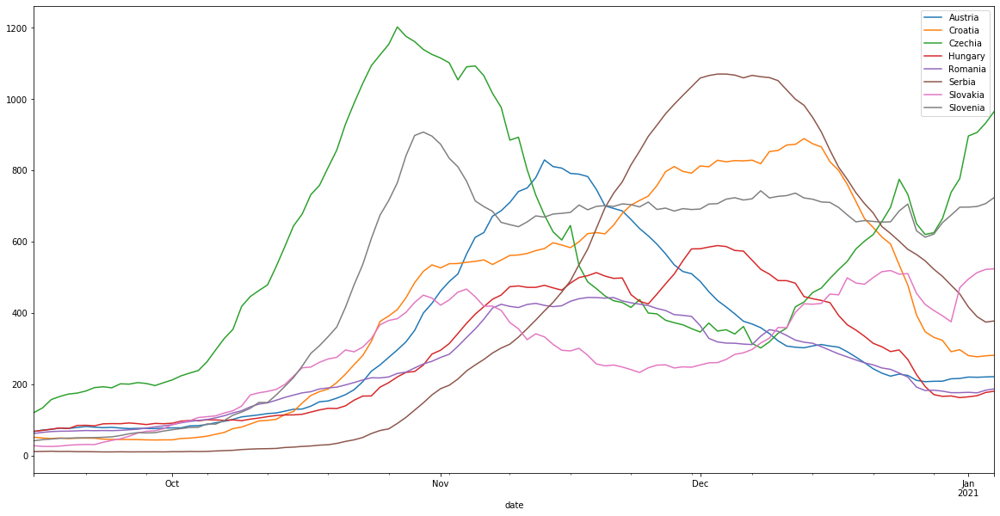

In [795]:
plt.figure(figsize=(20,10))
countries = ['Austria', 'Croatia', 'Czechia', 'Hungary', 'Romania', 'Serbia', 'Slovakia', 'Slovenia']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'][data1[data1.location == c].index >= '09-15-2020'].plot()

plt.legend(['Austria', 'Croatia', 'Czechia', 'Hungary', 'Romania', 'Serbia', 'Slovakia', 'Slovenia'])

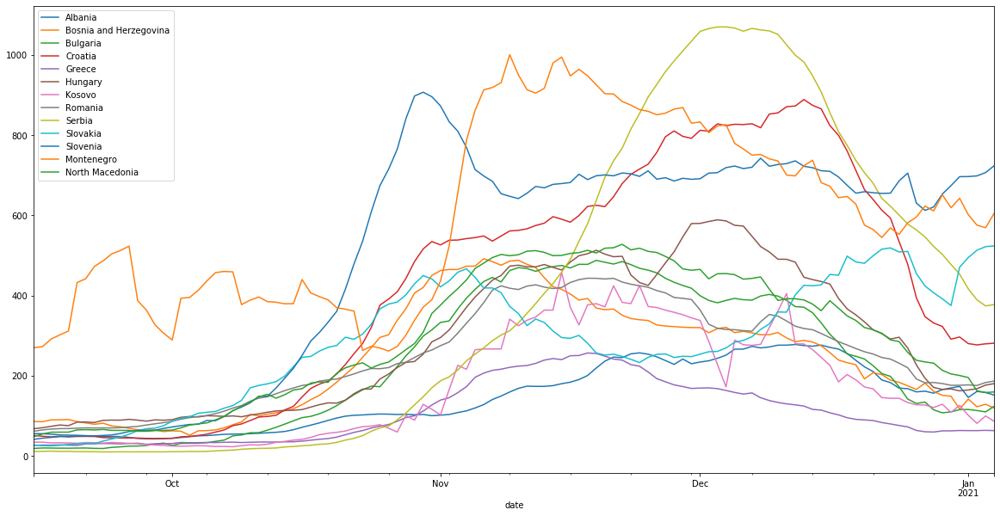

In [796]:
plt.figure(figsize=(20,10))
countries = ['Albania','Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Greece', 'Hungary', 'Kosovo', 
           'Romania', 'Serbia', 'Slovakia', 'Slovenia', 'Montenegro', 'North Macedonia']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'][data1[data1.location == c].index >= '09-15-2020'].plot()

plt.legend(['Albania','Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Greece', 'Hungary', 'Kosovo', 
           'Romania', 'Serbia', 'Slovakia', 'Slovenia', 'Montenegro', 'North Macedonia'])

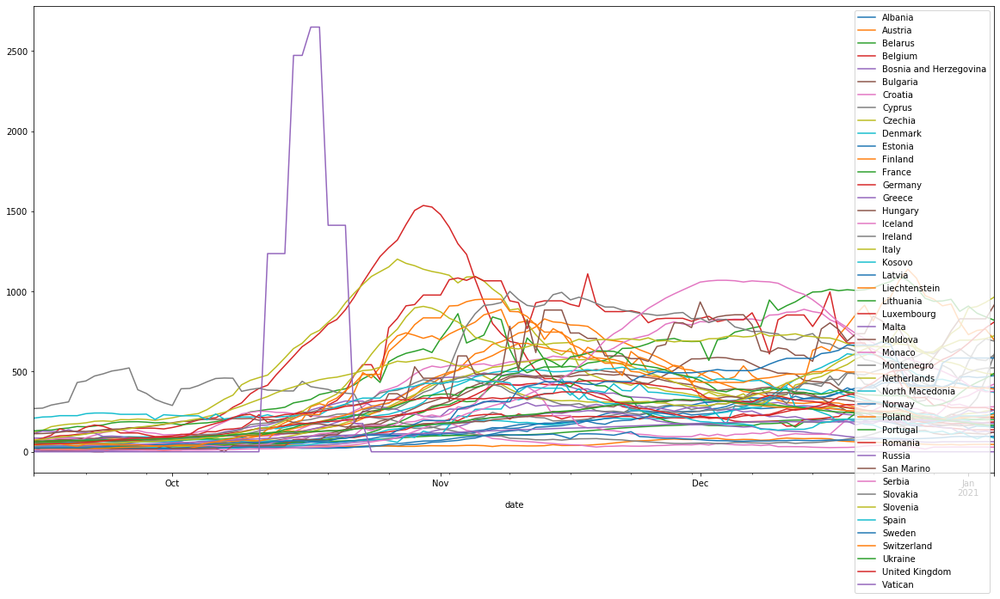

In [797]:
# all countries
plt.figure(figsize=(20,10))
countries = ['Albania','Austria', 'Belarus', 'Belgium',
           'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus',
           'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
           'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo',
           'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta',
           'Moldova', 'Monaco', 'Montenegro', 'Netherlands',
           'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania',
           'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain',
           'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican']
for c in countries:
    data1[data1.location == c]['new_cases_smoothed_per_million'][data1[data1.location == c].index >= '09-15-2020'].plot()

plt.legend(['Albania','Austria', 'Belarus', 'Belgium',
           'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus',
           'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
           'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo',
           'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta',
           'Moldova', 'Monaco', 'Montenegro', 'Netherlands',
           'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania',
           'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain',
           'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican'])

In [798]:
data1['new_cases_smoothed_per_million']

date
2020-03-09    NaN
2020-03-10    NaN
2020-03-11    NaN
2020-03-12    NaN
2020-03-13    NaN
             ... 
2020-12-31    0.0
2021-01-01    0.0
2021-01-02    0.0
2021-01-03    0.0
2021-01-04    0.0
Name: new_cases_smoothed_per_million, Length: 14651, dtype: float64

# Correlation after removing cross-sectional mean

In [799]:
cross_section_mean = data1_cases['new_cases_smoothed_per_million'].mean(axis=1)

In [800]:
len(cross_section_mean) == len(data1_cases[['new_cases_smoothed_per_million']])

True

In [801]:
data1_case_demean = data1_cases['new_cases_smoothed_per_million'].subtract(cross_section_mean, axis='rows')

In [802]:
data1_case_demean.corr()

location,Albania,Andorra,Austria,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,Finland,France,Germany,Greece,Hungary,Iceland,Ireland,Italy,Kosovo,Latvia,Liechtenstein,Lithuania,Luxembourg,Malta,Moldova,Monaco,Montenegro,Netherlands,North Macedonia,Norway,Poland,Portugal,Romania,Russia,San Marino,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Ukraine,United Kingdom,Vatican
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Albania,1.000000,-0.718613,-0.387713,0.897349,-0.490862,0.376105,0.282370,-0.433648,0.423124,-0.810182,0.492651,0.721947,0.923134,-0.278021,0.899647,0.888098,0.040773,0.696855,0.687429,-0.200455,0.804495,0.626632,-0.780444,-0.345266,-0.720595,0.724666,0.915429,0.556690,-0.542340,-0.466474,0.144387,0.901481,-0.369495,-0.242424,0.596298,0.933468,-0.406827,-0.092401,-0.227431,-0.829980,0.370317,0.102512,-0.849515,0.964906,-0.020318,0.167171
Andorra,-0.718613,1.000000,0.205350,-0.720721,0.671471,-0.193659,-0.327040,0.123035,-0.608004,0.769732,-0.622203,-0.776584,-0.605233,0.477771,-0.792579,-0.605759,-0.133299,-0.223838,-0.363918,-0.023413,-0.684979,-0.729006,0.278889,-0.122328,0.439789,-0.208678,-0.518463,-0.452183,0.395932,0.475691,-0.202108,-0.615614,0.184716,-0.056094,-0.348515,-0.678822,-0.099745,-0.210709,0.070469,0.467599,0.097530,-0.527803,0.504476,-0.625744,-0.046014,0.172700
Austria,-0.387713,0.205350,1.000000,-0.481220,0.052124,0.339625,0.659819,0.350912,-0.616474,0.029127,-0.690941,-0.585868,-0.425401,0.246970,-0.459189,-0.104669,0.536772,-0.421093,-0.577131,0.887215,0.140744,-0.645036,0.169953,-0.040961,0.605659,-0.282989,-0.383224,-0.334221,0.564926,-0.529571,0.666598,-0.360182,0.923303,0.742274,0.397975,-0.470502,0.200287,0.143846,-0.641932,0.287340,-0.057069,-0.128453,0.549963,-0.306271,-0.498553,-0.346675
Belarus,0.897349,-0.720721,-0.481220,1.000000,-0.380923,0.240777,0.110109,-0.592459,0.479428,-0.684289,0.525165,0.733707,0.939766,-0.198395,0.922200,0.853966,-0.162602,0.721773,0.808317,-0.211971,0.624239,0.673600,-0.676248,-0.372588,-0.803179,0.653666,0.769748,0.664086,-0.718361,-0.337637,-0.062300,0.919217,-0.391661,-0.298663,0.380457,0.982041,-0.324777,-0.250426,-0.044250,-0.821674,0.321198,0.110409,-0.796802,0.857366,0.212237,0.227342
Belgium,-0.490862,0.671471,0.052124,-0.380923,1.000000,0.265628,-0.207244,-0.161655,-0.626982,0.747013,-0.585203,-0.760141,-0.266602,0.781233,-0.466346,-0.266653,-0.400223,0.048330,-0.059768,0.055929,-0.472671,-0.716696,0.152467,-0.492061,0.312239,0.003355,-0.442283,-0.103519,-0.142358,0.415000,-0.213826,-0.262405,0.236679,-0.329892,-0.273512,-0.345744,-0.311938,-0.577761,0.205515,0.262485,0.330009,-0.746453,0.572715,-0.479401,-0.091011,0.156754
Bosnia and Herzegovina,0.376105,-0.193659,0.339625,0.240777,0.265628,1.000000,0.659931,-0.219781,-0.433528,-0.221669,-0.375735,-0.241645,0.393527,0.494070,0.230931,0.596636,0.176529,0.327877,0.143130,0.411751,0.640056,-0.320127,-0.464198,-0.660531,-0.010636,0.486660,0.338580,0.291339,-0.178930,-0.545490,0.558488,0.417304,0.470767,-0.051204,0.719868,0.340421,-0.537302,-0.359877,-0.433826,-0.378052,0.530274,-0.504103,0.055826,0.391988,-0.508974,-0.108185
Bulgaria,0.282370,-0.327040,0.659819,0.110109,-0.207244,0.659931,1.000000,0.299121,-0.367059,-0.532364,-0.380146,-0.158311,0.146110,-0.027576,0.098134,0.422127,0.726810,-0.052441,-0.242029,0.696465,0.704735,-0.256584,-0.387168,-0.215779,0.277278,0.081096,0.238635,-0.162628,0.156838,-0.851879,0.906274,0.155592,0.653791,0.505678,0.804988,0.130130,-0.049972,0.283037,-0.777543,-0.142179,-0.038388,0.010848,0.043932,0.330051,-0.745567,-0.272860
Croatia,-0.433648,0.123035,0.350912,-0.592459,-0.161655,-0.219781,0.299121,1.000000,-0.122404,0.072200,-0.105807,-0.248951,-0.693883,-0.404431,-0.547197,-0.620938,0.695252,-0.801664,-0.862647,0.147641,-0.208629,-0.205702,0.440571,0.690431,0.717885,-0.710125,-0.327831,-0.832693,0.606944,-0.008124,0.424137,-0.731180,0.222954,0.410648,-0.108098,-0.642603,0.505496,0.857648,-0.117586,0.746513,-0

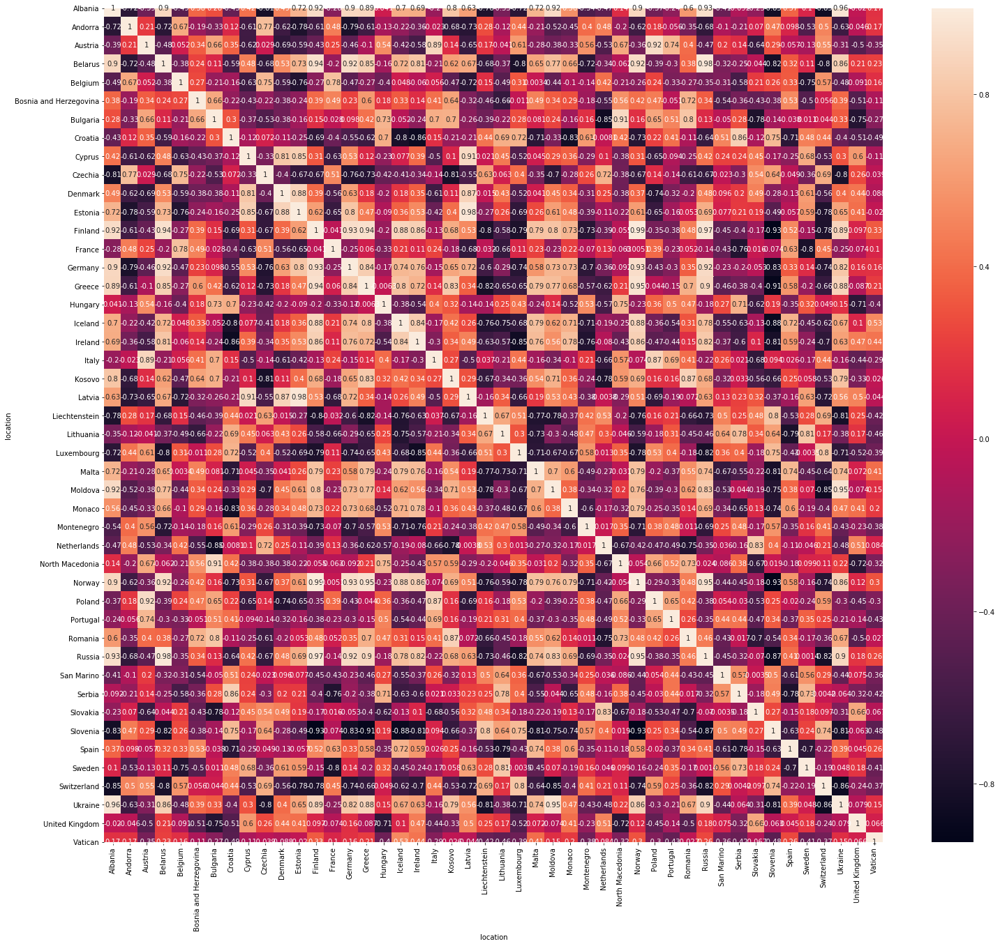

In [803]:
plt.figure(figsize=(25,22))
sn.heatmap(data1_case_demean.corr(), annot=True)

## sorted by France column

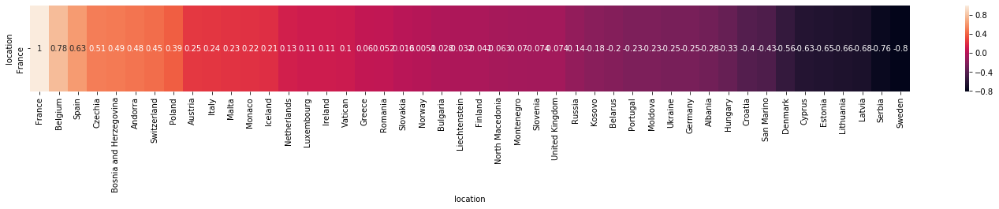

In [804]:
plt.figure(figsize=(25,2))
sn.heatmap(data1_case_demean.corr().loc[['France']].sort_values(by='France', axis=1, ascending=False), annot=True)

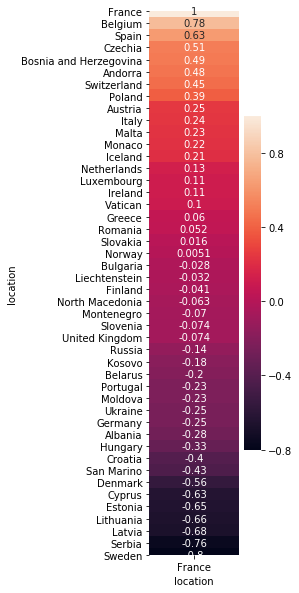

In [805]:
plt.figure(figsize=(2,10))
sn.heatmap(data1_case_demean.corr()[['France']].sort_values('France', ascending=False), annot=True)

## sorted by Austria column

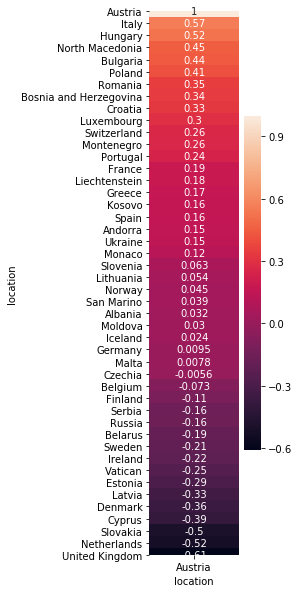

In [806]:
plt.figure(figsize=(2,10))
sn.heatmap(data1_case_demean.corr('spearman')[['Austria']].sort_values('Austria',ascending=False), annot=True)

## sorted by Belarus column

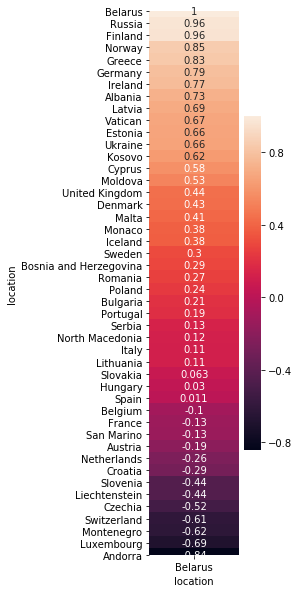

In [807]:
plt.figure(figsize=(2,10))
sn.heatmap(data1_case_demean.corr('spearman')[['Belarus']].sort_values('Belarus',ascending=False), annot=True)

## sorted by UK column

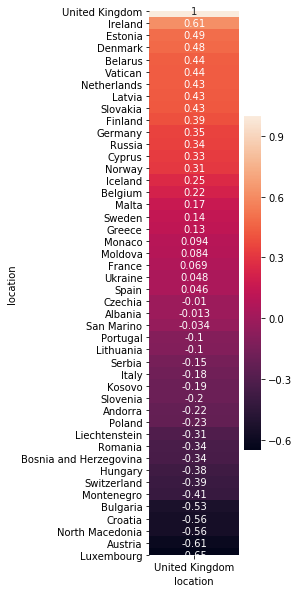

In [808]:
plt.figure(figsize=(2,10))
sn.heatmap(data1_case_demean.corr('spearman')[['United Kingdom']].sort_values('United Kingdom',ascending=False), annot=True)

# sorted by Hungary

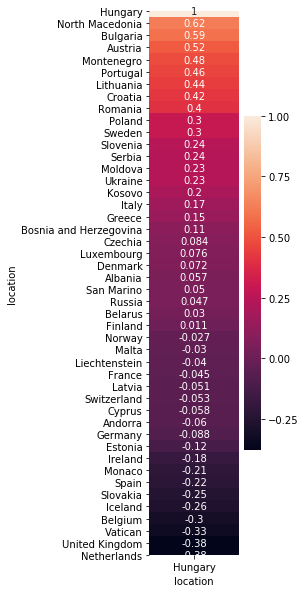

In [809]:
plt.figure(figsize=(2,10))
sn.heatmap(data1_case_demean.corr('spearman')[['Hungary']].sort_values('Hungary',ascending=False), annot=True)

## sorted by Kosovo column

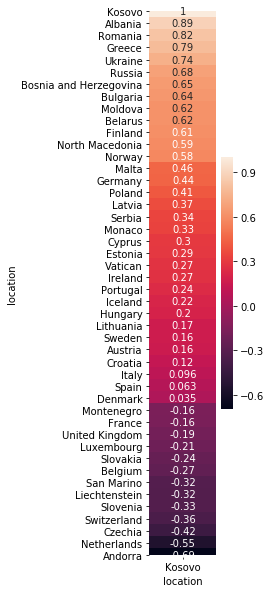

In [810]:
plt.figure(figsize=(1.5,10))
sn.heatmap(data1_case_demean.corr('spearman')[['Kosovo']].sort_values('Kosovo',ascending=False), annot=True)

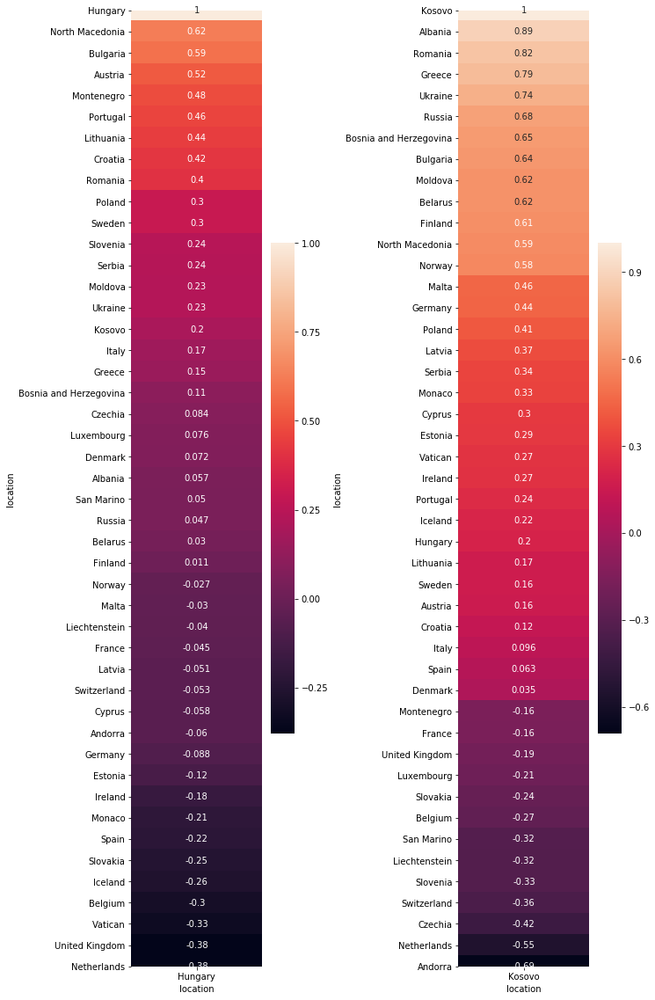

In [811]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,20))
fig.subplots_adjust(hspace=5)
fig.subplots_adjust(wspace=1)
sn.heatmap(data1_case_demean.corr('spearman')[['Hungary']].sort_values('Hungary',ascending=False), annot=True, ax=ax1)
g2=sn.heatmap(data1_case_demean.corr('spearman')[['Kosovo']].sort_values('Kosovo',ascending=False), annot=True, ax=ax2)
plt.show()

In [812]:
# plt.figure(figsize=(20,20))
# countries = ['France','Germany','Spain','Andorra','Monaco','Switzerland','Luxembourg','Belgium','Netherlands', 'Czechia','Liechtenstein','Austria']

# plt.plot(data1_case_demean[countries])
# # data1_case_demean[countries].plot()

# plt.legend(countries)

# Dynamic time warpping (Not working well!!!)
https://towardsdatascience.com/four-ways-to-quantify-synchrony-between-time-series-data-b99136c4a9c9

In [813]:
#!pip install dtw

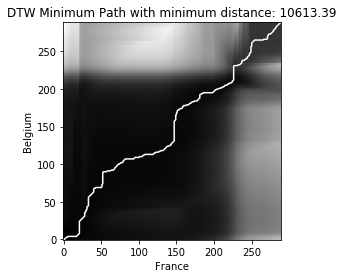

In [814]:
from dtw import dtw, accelerated_dtw

x = data1_cases['new_cases_smoothed_per_million'].dropna()['France'].values
y = data1_cases['new_cases_smoothed_per_million'].dropna()['Belgium'].values

d, cost_matrix, acc_cost_matrix, path = accelerated_dtw(x, y, dist='euclidean')

plt.imshow(acc_cost_matrix.T, origin='lower', cmap='gray', interpolation='nearest')
plt.plot(path[0], path[1], 'w')
plt.xlabel('France')
plt.ylabel('Belgium')
plt.title(f'DTW Minimum Path with minimum distance: {np.round(d,2)}')
plt.show()

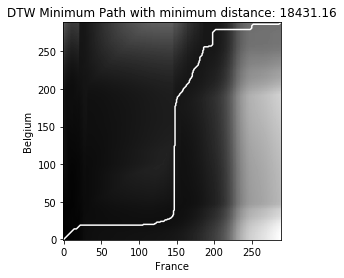

In [815]:
x = data1_cases['new_cases_smoothed_per_million'].dropna()['France'].values
y = data1_cases['new_cases_smoothed_per_million'].dropna()['Russia'].values

d, cost_matrix, acc_cost_matrix, path = accelerated_dtw(x, y, dist='euclidean')

plt.imshow(acc_cost_matrix.T, origin='lower', cmap='gray', interpolation='nearest')
plt.plot(path[0], path[1], 'w')
plt.xlabel('France')
plt.ylabel('Belgium')
plt.title(f'DTW Minimum Path with minimum distance: {np.round(d,2)}')
plt.show()

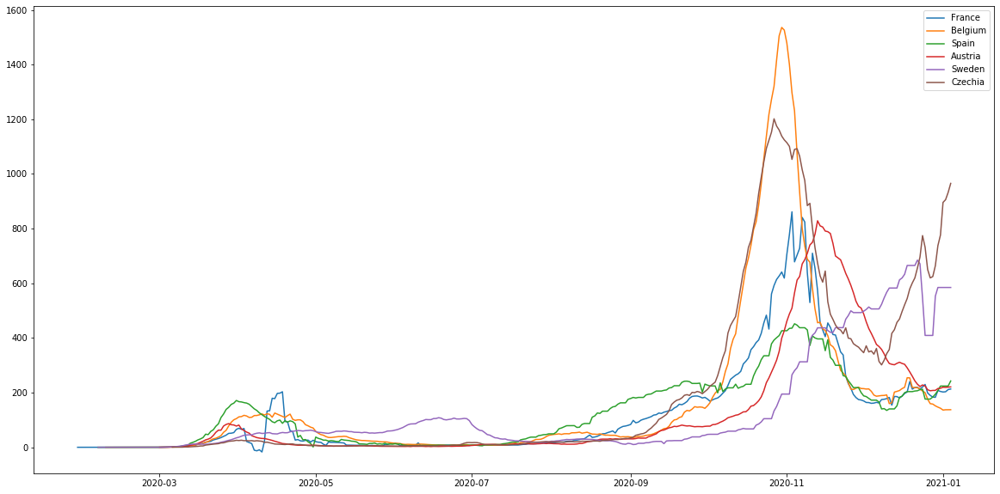

In [816]:
plt.figure(figsize=(20,10))
countries = ['France','Belgium','Spain','Austria','Sweden','Czechia']
plt.plot(data1_cases['new_cases_smoothed_per_million'][countries])
plt.legend(countries)

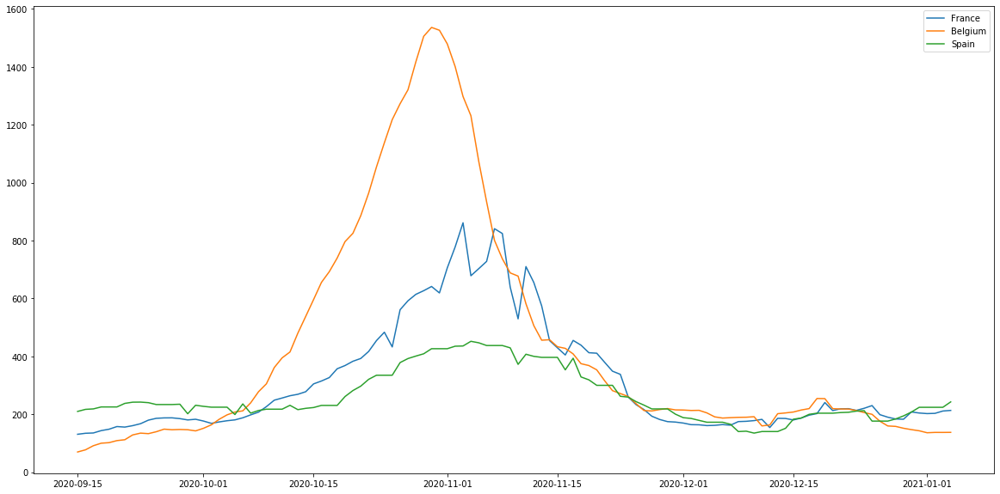

In [817]:
# post mid Sep
plt.figure(figsize=(20,10))
countries = ['France','Belgium','Spain']
plt.plot(data1_cases['new_cases_smoothed_per_million'].loc['2020-09-15':,countries])
plt.legend(countries)

# Time cross correlations
code modified from https://towardsdatascience.com/four-ways-to-quantify-synchrony-between-time-series-data-b99136c4a9c9

In [818]:
def crosscorr(datax, datay, lag=0, wrap=False):
    """ Lag-N cross correlation. 
    Shifted data filled with NaNs 
    
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length
    Returns
    ----------
    crosscorr : float
    """
    if wrap:
        shiftedy = datay.shift(lag)
        shiftedy.iloc[:lag] = datay.iloc[-lag:].values
        return datax.corr(shiftedy)
    else: 
        return datax.corr(datay.shift(lag))

# check how the correlation works with post mid France vs Belgium

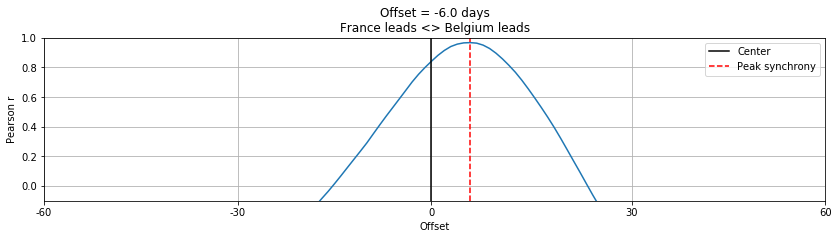

In [819]:
d1 = data1_cases['new_cases_smoothed_per_million'].dropna().loc['2020-09-15':,'France']
d2 = data1_cases['new_cases_smoothed_per_million'].dropna().loc['2020-09-15':,'Belgium']
days = 60
rs = [crosscorr(d1,d2, lag) for lag in range(-int(days),int(days+1))]
offset = np.ceil(len(rs)/2-1)-np.argmax(rs)
f,ax=plt.subplots(figsize=(14,3))
ax.plot(rs)
ax.axvline(np.ceil(len(rs)/2-1),color='k',linestyle='-',label='Center')
ax.axvline(np.argmax(rs),color='r',linestyle='--',label='Peak synchrony')
ax.set(title=f'Offset = {offset} days\nFrance leads <> Belgium leads',ylim=[-0.1,1],xlim=[0,60], xlabel='Offset',ylabel='Pearson r')
ax.set_xticks([0, 30, 60, 91, 121])
ax.set_xticklabels([-60, -30, 0, 30, 60]);
plt.grid()
plt.legend()

In [820]:
d1 = data1_cases['new_cases_smoothed_per_million'].dropna().loc['2020-09-15':,'France']
d2 = data1_cases['new_cases_smoothed_per_million'].dropna().loc['2020-09-15':,'Belgium']

print('contemporaneous correlation:', d1.corr(d2))
print('shifting Belgium by 6 periods:', d1.corr(d2.shift(6)))

contemporaneous correlation: 0.8411359490495305
shifting Belgium by 6 periods: 0.9670011545477782


# lead lag correlations to France

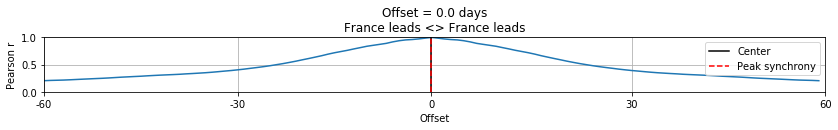

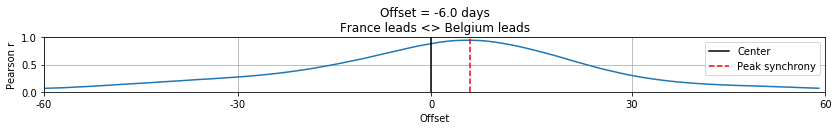

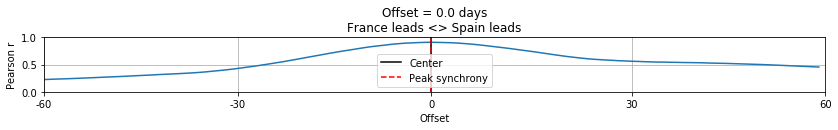

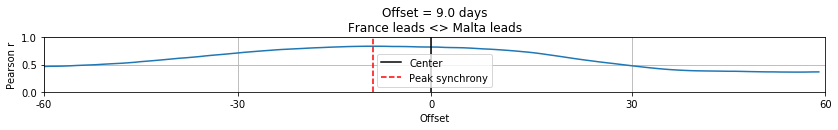

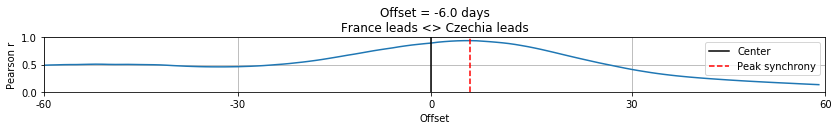

...

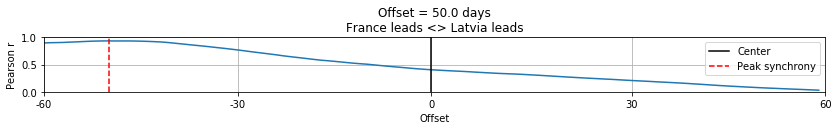

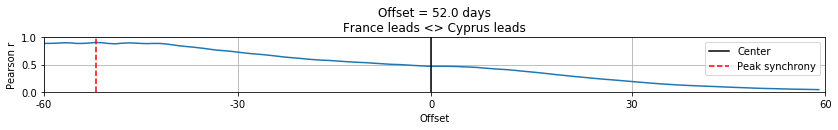

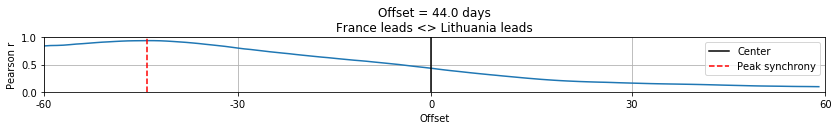

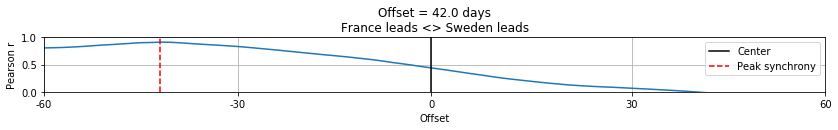

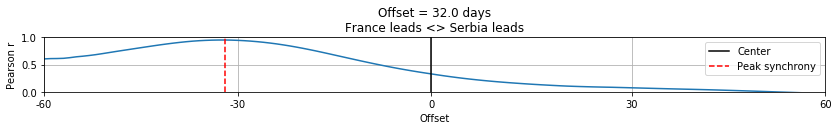

In [821]:
location = 'France'
d1 = data1_cases['new_cases_smoothed_per_million'].dropna()[location]
days = 60 # lead lag + & - windows 
plt.rcParams.update({'figure.max_open_warning': 0}) # do not show warnings

# Listed in order of highest to lowest cross-section de-meaned series contemporaneous correlation from the previous correlation matrix

# ['France', 'Belgium', 'Spain', 'Malta', 'Czechia', 'Netherlands',
#        'Andorra', 'Bosnia and Herzegovina', 'Poland', 'Austria', 'Iceland',
#        'Moldova', 'Ukraine', 'Slovakia', 'Ireland', 'Romania',
#        'United Kingdom', 'Greece', 'Italy', 'Monaco', 'Montenegro', 'Hungary',
#        'Albania', 'Luxembourg', 'Finland', 'Vatican', 'Norway', 'Slovenia',
#        'Switzerland', 'Belarus', 'North Macedonia', 'Germany', 'Russia',
#        'Croatia', 'Kosovo', 'Bulgaria', 'Denmark', 'Liechtenstein', 'Portugal',
#        'Estonia', 'San Marino', 'Latvia', 'Cyprus', 'Lithuania', 'Sweden',
#        'Serbia']

for c in data1_case_demean.corr('spearman').sort_values(location,ascending=False).index:
    
    d2 = data1_cases['new_cases_smoothed_per_million'].dropna()[c]
    rs = [crosscorr(d1,d2, lag) for lag in range(-int(days),int(days+1))]
    offset = np.ceil(len(rs)/2-1)-np.argmax(rs)
    f,ax=plt.subplots(figsize=(14,1))
    ax.plot(rs)
    ax.axvline(np.ceil(len(rs)/2-1),color='k',linestyle='-',label='Center')
    ax.axvline(np.argmax(rs),color='r',linestyle='--',label='Peak synchrony')
    ax.set(title=f'Offset = {offset} days\n{location} leads <> {c} leads',ylim=[-0,1],xlim=[0,60], xlabel='Offset',ylabel='Pearson r')
    ax.set_xticks([0, 30, 60, 91, 121])
    ax.set_xticklabels([-60, -30, 0, 30, 60]);
    plt.grid()
    plt.legend()

# lead lag correlations to Kosovo

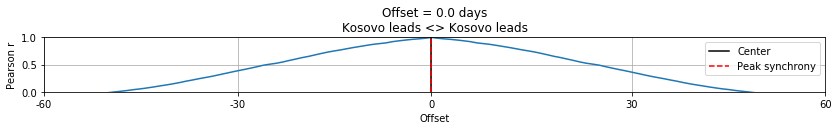

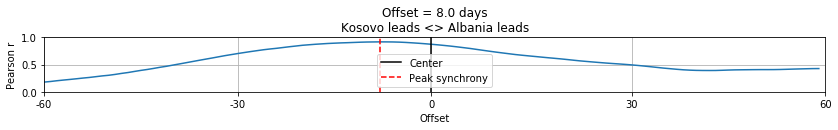

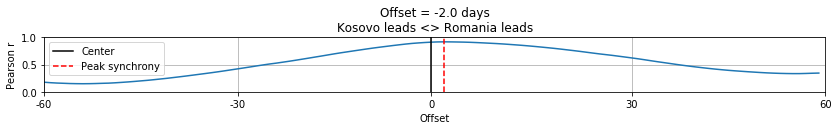

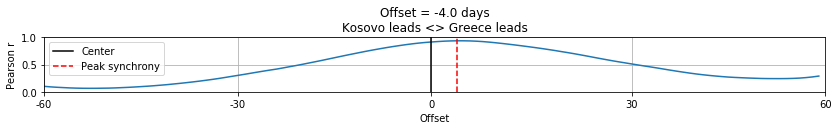

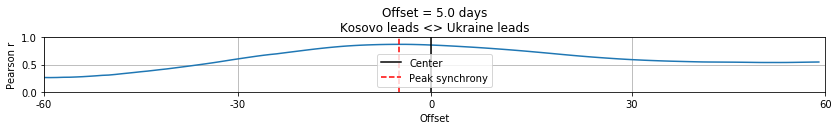

...

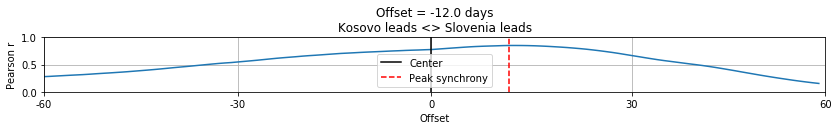

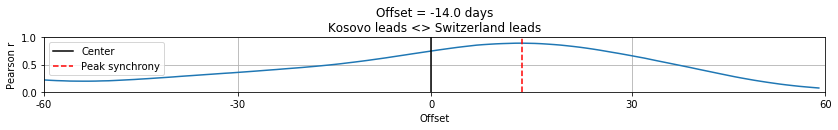

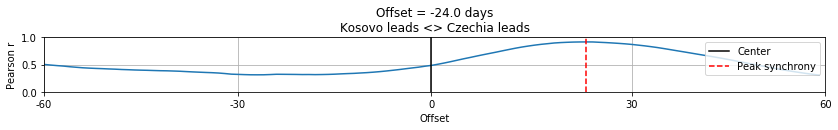

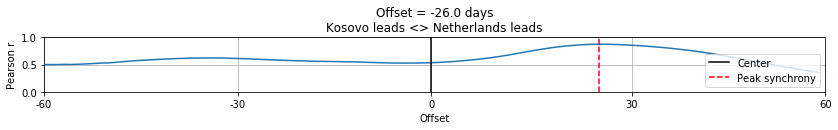

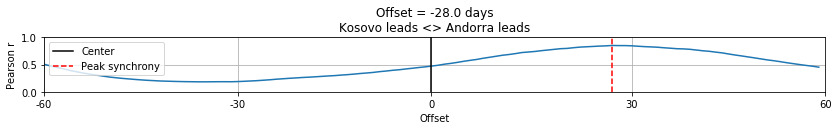

In [822]:
location = 'Kosovo'
d1 = data1_cases['new_cases_smoothed_per_million'].dropna()[location]
days = 60 # lead lag + & - windows 
plt.rcParams.update({'figure.max_open_warning': 0}) # do not show warnings

for c in data1_case_demean.corr('spearman').sort_values(location,ascending=False).index:
    
    d2 = data1_cases['new_cases_smoothed_per_million'].dropna()[c]
    rs = [crosscorr(d1,d2, lag) for lag in range(-int(days),int(days+1))]
    offset = np.ceil(len(rs)/2-1)-np.argmax(rs)
    f,ax=plt.subplots(figsize=(14,1))
    ax.plot(rs)
    ax.axvline(np.ceil(len(rs)/2-1),color='k',linestyle='-',label='Center')
    ax.axvline(np.argmax(rs),color='r',linestyle='--',label='Peak synchrony')
    ax.set(title=f'Offset = {offset} days\n{location} leads <> {c} leads',ylim=[-0,1],xlim=[0,60], xlabel='Offset',ylabel='Pearson r')
    ax.set_xticks([0, 30, 60, 91, 121])
    ax.set_xticklabels([-60, -30, 0, 30, 60]);
    plt.grid()
    plt.legend()

# de-meaned version

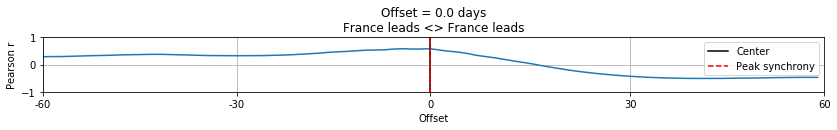

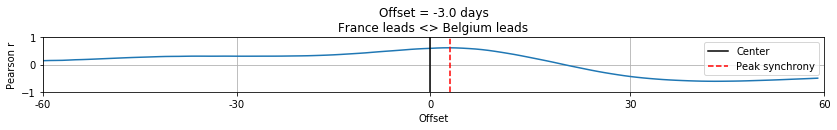

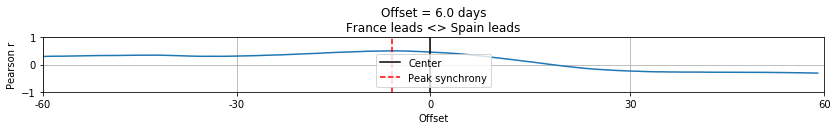

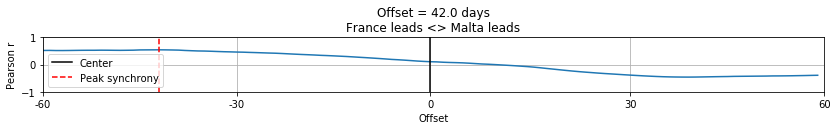

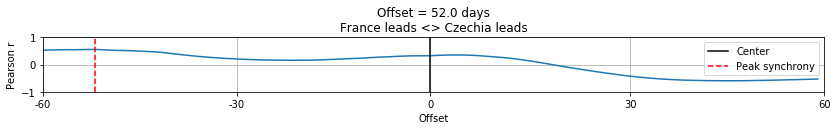

...

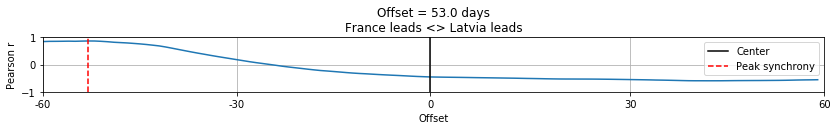

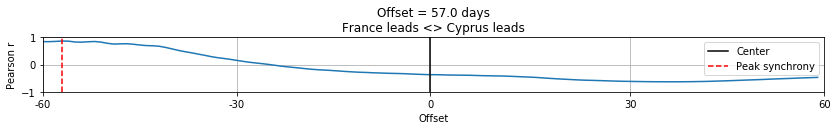

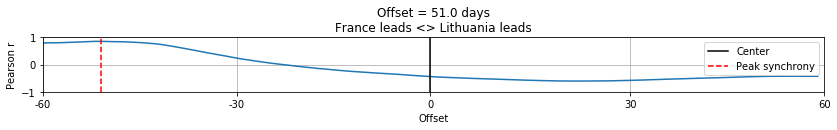

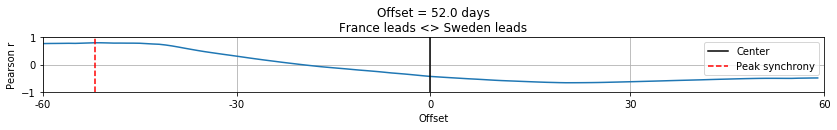

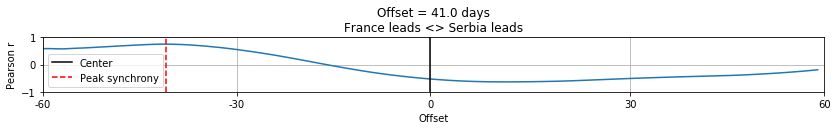

In [823]:
location = 'France'
d1 = data1_case_demean.dropna()[location]
days = 60 # lead lag + & - windows 
plt.rcParams.update({'figure.max_open_warning': 0}) # do not show warnings

# Listed in order of highest to lowest cross-section de-meaned series contemporaneous correlation from the previous correlation matrix

# ['France', 'Belgium', 'Spain', 'Malta', 'Czechia', 'Netherlands',
#        'Andorra', 'Bosnia and Herzegovina', 'Poland', 'Austria', 'Iceland',
#        'Moldova', 'Ukraine', 'Slovakia', 'Ireland', 'Romania',
#        'United Kingdom', 'Greece', 'Italy', 'Monaco', 'Montenegro', 'Hungary',
#        'Albania', 'Luxembourg', 'Finland', 'Vatican', 'Norway', 'Slovenia',
#        'Switzerland', 'Belarus', 'North Macedonia', 'Germany', 'Russia',
#        'Croatia', 'Kosovo', 'Bulgaria', 'Denmark', 'Liechtenstein', 'Portugal',
#        'Estonia', 'San Marino', 'Latvia', 'Cyprus', 'Lithuania', 'Sweden',
#        'Serbia']

for c in data1_case_demean.corr('spearman').sort_values(location,ascending=False).index:
    
    d2 = data1_cases['new_cases_smoothed_per_million'].dropna()[c]
    rs = [crosscorr(d1,d2, lag) for lag in range(-int(days),int(days+1))]
    offset = np.ceil(len(rs)/2-1)-np.argmax(rs)
    f,ax=plt.subplots(figsize=(14,1))
    ax.plot(rs)
    ax.axvline(np.ceil(len(rs)/2-1),color='k',linestyle='-',label='Center')
    ax.axvline(np.argmax(rs),color='r',linestyle='--',label='Peak synchrony')
    ax.set(title=f'Offset = {offset} days\n{location} leads <> {c} leads',ylim=[-1,1],xlim=[0,60], xlabel='Offset',ylabel='Pearson r')
    ax.set_xticks([0, 30, 60, 91, 121])
    ax.set_xticklabels([-60, -30, 0, 30, 60]);
    plt.grid()
    plt.legend()